<a href="https://colab.research.google.com/github/ankashchenko/ankashchenko/blob/main/Single_cell_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Скачивание датасетов и импорт библиотек

In [1]:
!pip install scanpy[leiden] bbknn harmonypy scrublet
import scanpy as sc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import bbknn
import scanpy.external as sce

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.2/119.2 kB 10.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 27.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 kB 35.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 37.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.8/79.8 kB 7.4 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86832 sha256=2f958300f52fcd5738aecd23fb7be22d94aecae81e3b7e4669108d92b81d218

In [2]:
# Скачивание датасета человека
! wget https://cf.10xgenomics.com/samples/cell-exp/4.0.0/Parent_NGSC3_DI_PBMC/Parent_NGSC3_DI_PBMC_filtered_feature_bc_matrix.h5

# Чтение датасета
human_adata = sc.read_10x_h5('/content/Parent_NGSC3_DI_PBMC_filtered_feature_bc_matrix.h5')

# Делаем гены уникальными
human_adata.var_names_make_unique()

# Смотрим на датасет
human_adata

--2023-12-21 08:04:05--  https://cf.10xgenomics.com/samples/cell-exp/4.0.0/Parent_NGSC3_DI_PBMC/Parent_NGSC3_DI_PBMC_filtered_feature_bc_matrix.h5
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.0.173, 104.18.1.173, 2606:4700::6812:ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.0.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35470290 (34M) [binary/octet-stream]
Saving to: ‘Parent_NGSC3_DI_PBMC_filtered_feature_bc_matrix.h5’

Parent_NGSC3_DI_PBM 100%[===================>]  33.83M  11.3MB/s    in 3.0s    

2023-12-21 08:04:09 (11.3 MB/s) - ‘Parent_NGSC3_DI_PBMC_filtered_feature_bc_matrix.h5’ saved [35470290/35470290]



/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 10194 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

In [3]:
# Скачивание датасета мыши
!wget https://cf.10xgenomics.com/samples/cell-exp/6.0.0/SC3_v3_NextGem_DI_CellPlex_Mouse_PBMC_10K_PBMCs_mouse_1/SC3_v3_NextGem_DI_CellPlex_Mouse_PBMC_10K_PBMCs_mouse_1_count_sample_feature_bc_matrix.h5

# Чтение датасета
mouse_adata = sc.read_10x_h5('/content/SC3_v3_NextGem_DI_CellPlex_Mouse_PBMC_10K_PBMCs_mouse_1_count_sample_feature_bc_matrix.h5')

# Делаем гены уникальными
mouse_adata.var_names_make_unique()

# Смотрим на датасет
mouse_adata

--2023-12-21 08:04:11--  https://cf.10xgenomics.com/samples/cell-exp/6.0.0/SC3_v3_NextGem_DI_CellPlex_Mouse_PBMC_10K_PBMCs_mouse_1/SC3_v3_NextGem_DI_CellPlex_Mouse_PBMC_10K_PBMCs_mouse_1_count_sample_feature_bc_matrix.h5
Resolving cf.10xgenomics.com (cf.10xgenomics.com)... 104.18.0.173, 104.18.1.173, 2606:4700::6812:ad, ...
Connecting to cf.10xgenomics.com (cf.10xgenomics.com)|104.18.0.173|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11746926 (11M) [binary/octet-stream]
Saving to: ‘SC3_v3_NextGem_DI_CellPlex_Mouse_PBMC_10K_PBMCs_mouse_1_count_sample_feature_bc_matrix.h5’

SC3_v3_NextGem_DI_C 100%[===================>]  11.20M  10.5MB/s    in 1.1s    

2023-12-21 08:04:12 (10.5 MB/s) - ‘SC3_v3_NextGem_DI_CellPlex_Mouse_PBMC_10K_PBMCs_mouse_1_count_sample_feature_bc_matrix.h5’ saved [11746926/11746926]



/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 4598 × 32285
    var: 'gene_ids', 'feature_types', 'genome'

# Контроль качества

## *

Text(0.5, 0.98, 'Human dataset')

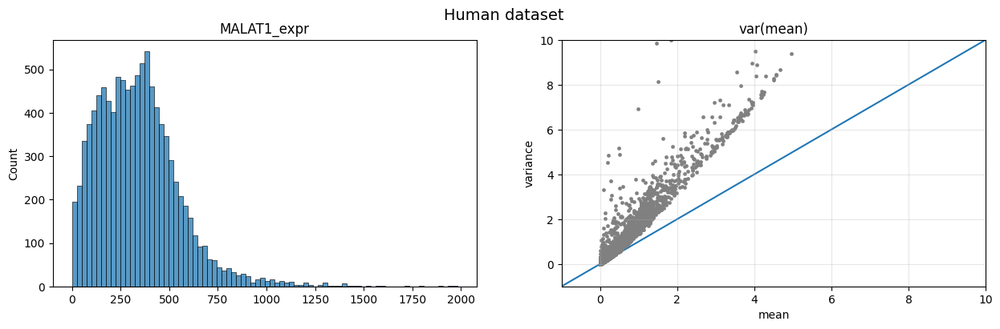

In [ ]:
# Expression of LncRNA in human cells
MALAT1_expr = human_adata[:, "MALAT1"].X.A.T[0]

# mean and variance values
mean = human_adata.X.mean(axis=0).A[0]
variance = np.var(human_adata.X.A, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 4))
ax1 = sns.histplot(ax=axes[0], data=MALAT1_expr)
axes[0].set_title('MALAT1_expr')
ax2 = sns.scatterplot(
    x=np.log(mean + 1),
    y=np.log(variance + 1),
    edgecolor=None,
    color="grey",
    s=10,
)
axes[1].set_title('var(mean)')
axes[1].plot([-10, 20], [-10, 20], zorder=-2)
axes[1].set_xlim(-1, 10)
axes[1].set_ylim(-1, 10)
axes[1].grid(alpha=0.3)
axes[1].set_xlabel('mean')
axes[1].set_ylabel('variance')

fig.suptitle('Human dataset', fontsize=14)

Text(0.5, 0.98, 'Mouse dataset')

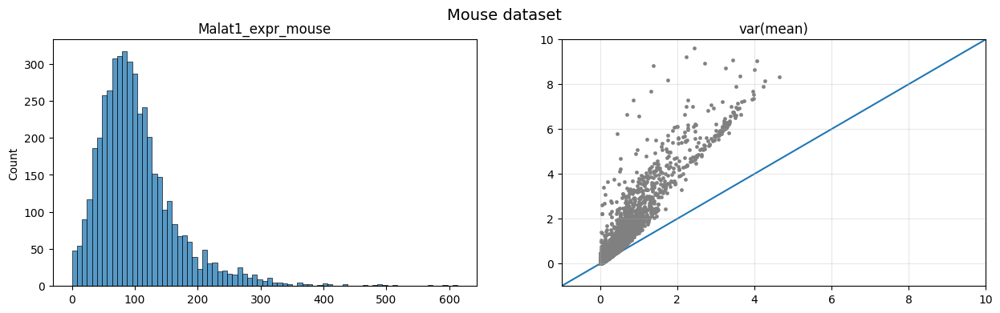

In [ ]:
# Expression of LncRNA in murine cells
MALAT1_expr_mouse = mouse_adata[:, "Malat1"].X.A.T[0]

# mean and variance values
mean_mouse = mouse_adata.X.mean(axis=0).A[0]
variance_mouse = np.var(mouse_adata.X.A, axis=0)

fig, axes = plt.subplots(1, 2, figsize=(15, 4))
ax1 = sns.histplot(ax=axes[0], data=MALAT1_expr_mouse)
axes[0].set_title('Malat1_expr_mouse')
ax2 = sns.scatterplot(
    x=np.log(mean_mouse + 1),
    y=np.log(variance_mouse + 1),
    edgecolor=None,
    color="grey",
    s=10,
)
axes[1].set_title('var(mean)')
axes[1].plot([-10, 20], [-10, 20], zorder=-2)
axes[1].set_xlim(-1, 10)
axes[1].set_ylim(-1, 10)
axes[1].grid(alpha=0.3)
fig.suptitle('Mouse dataset', fontsize=14)

## Датасет мыши

Text(0.5, 0.98, 'Quality control, murine dataset')

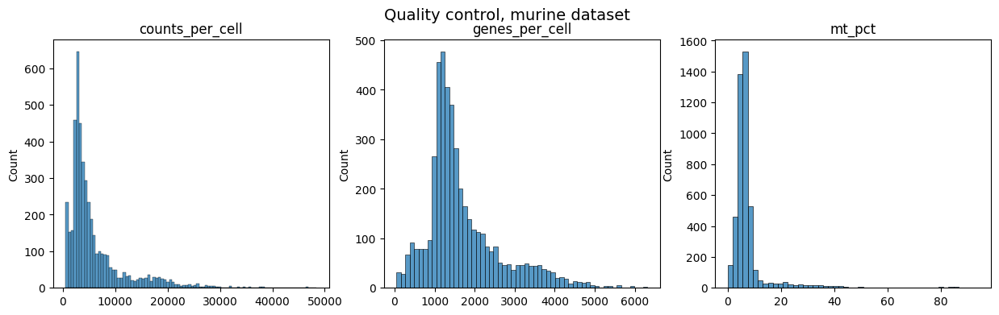

In [4]:
# число каунтов на клетку
counts_per_cell_m = mouse_adata.X.sum(axis=1).T.A[0]

# число генов на клетку
genes_per_cell_m = (mouse_adata.X > 0).sum(axis=1).T.A[0]


# процент митохондриальных генов
mouse_adata.var["mt"] = mouse_adata.var.index.str.startswith("mt-")
mt_counts_per_cell_m = mouse_adata[:, mouse_adata.var.mt].X.sum(axis=1).T.A[0]
mt_pct_m = mt_counts_per_cell_m/counts_per_cell_m * 100

# Гистограммы
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
ax1 = sns.histplot(ax=axes[0], data=counts_per_cell_m)
axes[0].set_title('counts_per_cell')
ax2 = sns.histplot(ax=axes[1], data=genes_per_cell_m)
axes[1].set_title('genes_per_cell')
ax3 = sns.histplot(ax=axes[2], data=mt_pct_m, bins=50)
axes[2].set_title('mt_pct')
fig.suptitle('Quality control, murine dataset', fontsize=14)

### Логарифмические координаты

In [5]:
sc.pp.calculate_qc_metrics(
    mouse_adata,
    qc_vars=["mt"],
    percent_top=None,
    inplace=True,
    log1p=False,
)

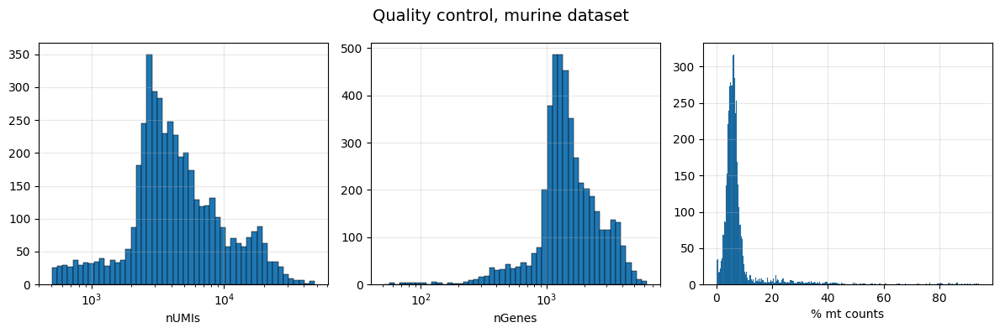

In [6]:
fig, axes = plt.subplots(ncols=3, figsize=(12, 4))

sns.histplot(mouse_adata.obs.total_counts, log_scale=True, alpha=1, bins=50, edgecolor="black", ax=axes[0])
axes[0].set_ylabel("")
axes[0].set_xlabel("nUMIs")
axes[0].grid(alpha=0.3)

sns.histplot(mouse_adata.obs.n_genes_by_counts, log_scale=True, alpha=1, bins=50, edgecolor="black", ax=axes[1])
axes[1].set_ylabel("")
axes[1].set_xlabel("nGenes")
axes[1].grid(alpha=0.3)

sns.histplot(mouse_adata.obs.pct_counts_mt, alpha=1, edgecolor="black", ax=axes[2])
axes[2].set_ylabel("")
axes[2].set_xlabel("% mt counts")
axes[2].grid(alpha=0.3)

fig.suptitle('Quality control, murine dataset', fontsize=14)
fig.tight_layout()

Фильтрация данных:

In [7]:
mouse_adata = mouse_adata[mouse_adata.obs.pct_counts_mt < 15]
mouse_adata = mouse_adata[mouse_adata.obs.total_counts > 1000]
mouse_adata = mouse_adata[mouse_adata.obs.n_genes_by_counts > 900]
mouse_adata

View of AnnData object with n_obs × n_vars = 4050 × 32285
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

Результат:

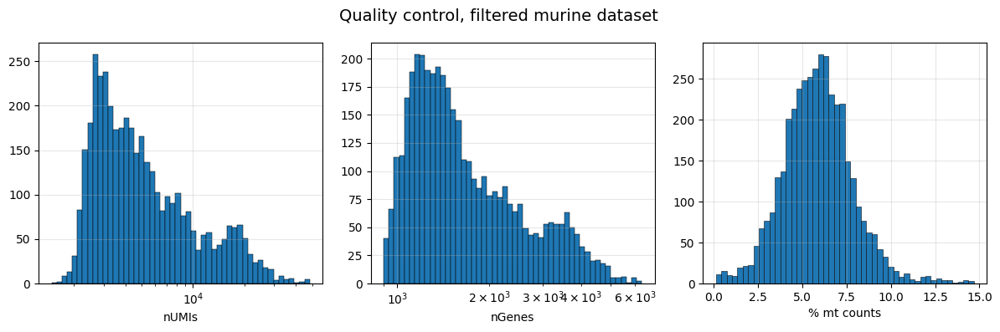

In [8]:
fig, axes = plt.subplots(ncols=3, figsize=(12, 4))

sns.histplot(mouse_adata.obs.total_counts, log_scale=True, alpha=1, bins=50, edgecolor="black", ax=axes[0])
axes[0].set_ylabel("")
axes[0].set_xlabel("nUMIs")
axes[0].grid(alpha=0.3)

sns.histplot(mouse_adata.obs.n_genes_by_counts, log_scale=True, alpha=1, bins=50, edgecolor="black", ax=axes[1])
axes[1].set_ylabel("")
axes[1].set_xlabel("nGenes")
axes[1].grid(alpha=0.3)

sns.histplot(mouse_adata.obs.pct_counts_mt, alpha=1, edgecolor="black", ax=axes[2])
axes[2].set_ylabel("")
axes[2].set_xlabel("% mt counts")
axes[2].grid(alpha=0.3)

fig.suptitle('Quality control, filtered murine dataset', fontsize=14)
fig.tight_layout()

## Датасет человека

Text(0.5, 0.98, 'Quality control, human dataset')

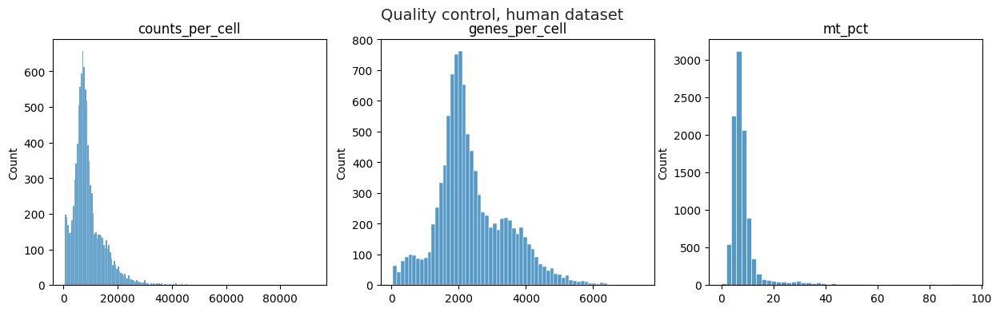

In [9]:
# число каунтов на клетку
counts_per_cell_h = human_adata.X.sum(axis=1).T.A[0]

# число генов на клетку
genes_per_cell_h = (human_adata.X > 0).sum(axis=1).T.A[0]

# процент митохондриальных генов
human_adata.var["mt"] = human_adata.var.index.str.startswith("MT-")
mt_counts_per_cell_h = human_adata[:, human_adata.var.mt].X.sum(axis=1).T.A[0]
mt_pct_h = mt_counts_per_cell_h/counts_per_cell_h * 100

# Гистограммы
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
sns.set()
ax1 = sns.histplot(ax=axes[0], data=counts_per_cell_h)
axes[0].set_title('counts_per_cell')
ax2 = sns.histplot(ax=axes[1], data=genes_per_cell_h)
axes[1].set_title('genes_per_cell')
ax3 = sns.histplot(ax=axes[2], data=mt_pct_h, bins=50)
axes[2].set_title('mt_pct')
fig.suptitle('Quality control, human dataset', fontsize=14)

### Логарифмические координаты

In [10]:
sc.pp.calculate_qc_metrics(
    human_adata,
    qc_vars=["mt"],
    percent_top=None,
    inplace=True,
    log1p=False,
)

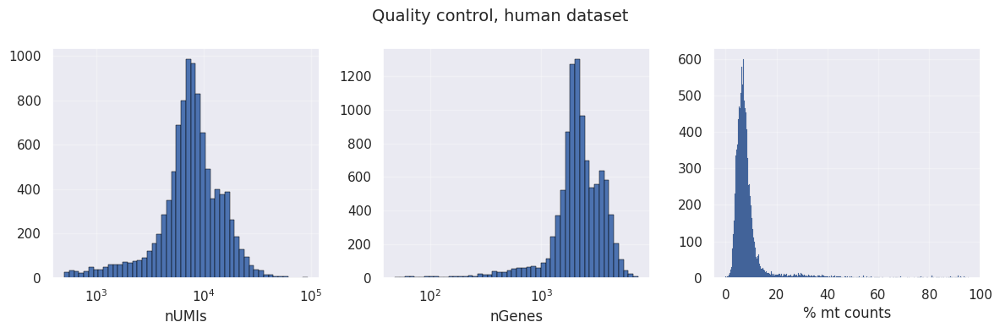

In [11]:
fig, axes = plt.subplots(ncols=3, figsize=(12, 4))

sns.histplot(human_adata.obs.total_counts, log_scale=True, alpha=1, bins=50, edgecolor="black", ax=axes[0])
axes[0].set_ylabel("")
axes[0].set_xlabel("nUMIs")
axes[0].grid(alpha=0.3)

sns.histplot(human_adata.obs.n_genes_by_counts, log_scale=True, alpha=1, bins=50, edgecolor="black", ax=axes[1])
axes[1].set_ylabel("")
axes[1].set_xlabel("nGenes")
axes[1].grid(alpha=0.3)

sns.histplot(human_adata.obs.pct_counts_mt, alpha=1, edgecolor="black", ax=axes[2])
axes[2].set_ylabel("")
axes[2].set_xlabel("% mt counts")
axes[2].grid(alpha=0.3)

fig.suptitle('Quality control, human dataset', fontsize=14)
fig.tight_layout()

Фильтрация:

In [12]:
human_adata = human_adata[human_adata.obs.pct_counts_mt < 15]
human_adata = human_adata[human_adata.obs.total_counts > 1000]
human_adata = human_adata[human_adata.obs.n_genes_by_counts > 1000]

Результат:

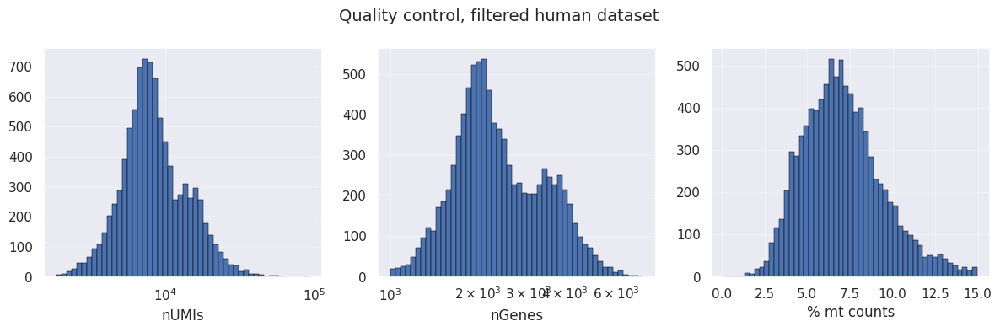

In [13]:
fig, axes = plt.subplots(ncols=3, figsize=(12, 4))

sns.histplot(human_adata.obs.total_counts, log_scale=True, alpha=1, bins=50, edgecolor="black", ax=axes[0])
axes[0].set_ylabel("")
axes[0].set_xlabel("nUMIs")
axes[0].grid(alpha=0.3)

sns.histplot(human_adata.obs.n_genes_by_counts, log_scale=True, alpha=1, bins=50, edgecolor="black", ax=axes[1])
axes[1].set_ylabel("")
axes[1].set_xlabel("nGenes")
axes[1].grid(alpha=0.3)

sns.histplot(human_adata.obs.pct_counts_mt, alpha=1, edgecolor="black", ax=axes[2])
axes[2].set_ylabel("")
axes[2].set_xlabel("% mt counts")
axes[2].grid(alpha=0.3)

fig.suptitle('Quality control, filtered human dataset', fontsize=14)
fig.tight_layout()

In [ ]:
human_adata

View of AnnData object with n_obs × n_vars = 9271 × 36601
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

## Поиск дублетов

In [14]:
# Отмечаем дублеты
sce.pp.scrublet(human_adata)
sce.pp.scrublet(mouse_adata)

/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.19
Detected doublet rate = 5.5%
Estimated detectable doublet fraction = 51.1%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 10.8%


/usr/local/lib/python3.10/dist-packages/scanpy/external/pp/_scrublet.py:267: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['doublet_score'] = scrubbed['obs']['doublet_score']
/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.29
Detected doublet rate = 1.1%
Estimated detectable doublet fraction = 30.6%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 3.6%


/usr/local/lib/python3.10/dist-packages/scanpy/external/pp/_scrublet.py:267: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['doublet_score'] = scrubbed['obs']['doublet_score']


# one-to-one ортологи

С помощью [OMA Browser](https://omabrowser.org/oma/genomePW/) получили лист ортологов

In [15]:
import gdown
# скачивание таблицы с ортологами
url = 'https://drive.google.com/uc?export=download&id=1zNWeMdmRKghVnHWeom9DhKj5r7P9dzsF'
output = 'orthologs.csv'
gdown.download(url, output)
orthologs = pd.read_csv('/content/orthologs.csv', sep=';')
orthologs

Downloading...
From: https://drive.google.com/uc?export=download&id=1zNWeMdmRKghVnHWeom9DhKj5r7P9dzsF
To: /content/orthologs.csv
100%|██████████| 693k/693k [00:00<00:00, 49.0MB/s]


,Human_gene_id,Mouse_gene_id,relation
0,ENSG00000015171,ENSMUSG00000021156,1 to 1
1,ENSG00000151240,ENSMUSG00000048264,1 to 1
2,ENSG00000107929,ENSMUSG00000033499,1 to 1
3,ENSG00000107937,ENSMUSG00000021149,1 to 1
4,ENSG00000067064,ENSMUSG00000058258,1 to 1
...,...,...,...
16105,ENSG00000185515,ENSMUSG00000031201,1 to 1
16106,ENSG00000155959,ENSMUSG00000031197,1 to 1
16107,ENSG00000155961,ENSMUSG00000031202,1 to 1
16108,ENSG00000124334,ENSMUSG00000020279,1 to 1


Функция для отметки ортологов в датасетах:

In [16]:
def ortholog_filter_mouse(x):
    '''
    Function returns True if this gene is the obtained ortholog list
    '''
    if x in list(orthologs['Mouse_gene_id']):
        return True
    else:
        return False


def ortholog_filter_human(x):
    '''
    Function returns True if a gene is an ortholog
    '''
    if x in list(orthologs['Human_gene_id']):
        return True
    else:
        return False

In [17]:
# сделаем колонку с отметками ортологов
mouse_adata.var['ortholog_mouse'] =  mouse_adata.var.gene_ids.map(ortholog_filter_mouse)
human_adata.var['ortholog_human'] =  human_adata.var.gene_ids.map(ortholog_filter_human)

In [18]:
# Посмотрим, сколько ортологов есть в каждом датасете
# Датасет мыши:
murine_ort_num = len(mouse_adata.var['ortholog_mouse'][mouse_adata.var['ortholog_mouse'] == True])
print(f'{murine_ort_num} генов из датасеты мыши (из общего числа {len(mouse_adata.var)} генов) ортологи')

# Датасет человека:
human_ort_num = len(human_adata.var['ortholog_human'][human_adata.var['ortholog_human'] == True])
print(f'{human_ort_num} генов из датасеты человека (из общего числа {len(human_adata.var)} генов) ортологи')

16052 генов из датасеты мыши (из общего числа 32285 генов) ортологи
16066 генов из датасеты человека (из общего числа 36601 генов) ортологи


In [19]:
# Добавим колонку с видом организма
human_adata.obs["Organism"] = "Human"
mouse_adata.obs["Organism"] = "Mouse"

In [20]:
# Переименуем мышиные гены для дальнейшего слияния датасетов
names = mouse_adata.var_names
new_names = []

for el in names:
    el = el.upper()
    new_names.append(el)

mouse_adata.var_names = new_names
# new_names

# Слияние датасетов

In [21]:
merged_adata = human_adata.concatenate(mouse_adata, join='inner', index_unique='-')
merged_adata

<ipython-input-21-c13c2ba535a6>:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  merged_adata = human_adata.concatenate(mouse_adata, join='inner', index_unique='-')


AnnData object with n_obs × n_vars = 13321 × 16284
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublet', 'Organism', 'batch'
    var: 'feature_types', 'mt', 'gene_ids-0', 'genome-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'ortholog_human-0', 'gene_ids-1', 'genome-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'ortholog_mouse-1'

In [22]:
merged_adata.var

,feature_types,mt,gene_ids-0,genome-0,n_cells_by_counts-0,mean_counts-0,pct_dropout_by_counts-0,total_counts-0,ortholog_human-0,gene_ids-1,genome-1,n_cells_by_counts-1,mean_counts-1,pct_dropout_by_counts-1,total_counts-1,ortholog_mouse-1
SAMD11,Gene Expression,False,ENSG00000187634,GRCh38,6,0.000589,99.941142,6.0,True,ENSMUSG00000096351,mm10,8,0.002392,99.826011,11.0,True
NOC2L,Gene Expression,False,ENSG00000188976,GRCh38,2648,0.326663,74.023936,3330.0,True,ENSMUSG00000095567,mm10,945,0.270552,79.447586,1244.0,True
PLEKHN1,Gene Expression,False,ENSG00000187583,GRCh38,84,0.010006,99.175986,102.0,True,ENSMUSG00000078485,mm10,176,0.039800,96.172249,183.0,True
PERM1,Gene Expression,False,ENSG00000187642,GRCh38,3,0.000294,99.970571,3.0,True,ENSMUSG00000078486,mm10,1,0.000217,99.978251,1.0,True
ISG15,Gene Expression,False,ENSG00000187608,GRCh38,5881,2.550912,42.309201,26004.0,True,ENSMUSG00000035692,mm10,750,0.678121,83.688560,3118.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ND3,Gene Expression,True,ENSG00000198840,GRCh38,10181,42.920444,0.127526,437531.0,True,ENSMUSG00000064360,mm10,4297,5.976946,6.546324,27482.0,True
MT-ND4L,Gene Expression,True,ENSG00000212907,GRCh38,7099,1.555621,30.360997,15858.0,True,ENSMUSG00000065947,mm10,2901,1.411918,36.907351,6492.0,True
MT-ND4,Gene Expression,True,ENSG00000198886,GRCh38,10190,63.442417,0.039239,646732.0,True,ENSMUSG00000064363,mm10,4545,20.821444,1.152675,95737.0,True
MT-ND5,Gene Expression,True,ENSG00000198786,GRCh38,10160,17.362762,0.333530,176996.0,True,ENSMUSG00000064367,mm10,4034,3.488908,12.266203,16042.0,True


In [23]:
merged_adata.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet_score,predicted_doublet,Organism,batch
AAACCCACATAACTCG-1-0,4803,22575.0,1204.0,5.333333,0.380435,True,Human,0
AAACCCACATGTAACC-1-0,2233,7758.0,686.0,8.842485,0.005935,False,Human,0
AAACCCAGTGAGTCAG-1-0,4324,21733.0,1374.0,6.322183,0.039468,False,Human,0
AAACGAACAGTCAGTT-1-0,4143,15311.0,1211.0,7.909347,0.380435,True,Human,0
AAACGAACATTCGGGC-1-0,2332,10013.0,779.0,7.779886,0.038394,False,Human,0
...,...,...,...,...,...,...,...,...
TTTGTTGCAGTCACGC-1-1,1448,3452.0,196.0,5.677868,0.010939,False,Mouse,1
TTTGTTGGTCGCGTCA-1-1,1087,2888.0,144.0,4.986149,0.013184,False,Mouse,1
TTTGTTGGTGCCAAGA-1-1,952,2186.0,130.0,5.946935,0.024641,False,Mouse,1
TTTGTTGTCGTTACCC-1-1,3661,20248.0,1315.0,6.494469,0.021855,False,Mouse,1


In [24]:
# скачиваем файл с именами ортологов
import gdown
url = 'https://drive.google.com/uc?export=download&id=1ZM1_bSBAcy_P7DUI3ENTSA9bKmjXrJTd'
output = 'orthologs_names.txt'
gdown.download(url, output)

Downloading...
From: https://drive.google.com/uc?export=download&id=1ZM1_bSBAcy_P7DUI3ENTSA9bKmjXrJTd
To: /content/orthologs_names.txt
100%|██████████| 119k/119k [00:00<00:00, 19.6MB/s]


'orthologs_names.txt'

In [25]:
gene_names = []
with open('/content/orthologs_names.txt') as names:
    names.readline()
    for line in names:
        gene_names.append(line.strip())

Оставляем только ортологи в слитом датасете

In [26]:
merged_adata = merged_adata[:, merged_adata.var_names.isin(gene_names)]
merged_adata.var

,feature_types,mt,gene_ids-0,genome-0,n_cells_by_counts-0,mean_counts-0,pct_dropout_by_counts-0,total_counts-0,ortholog_human-0,gene_ids-1,genome-1,n_cells_by_counts-1,mean_counts-1,pct_dropout_by_counts-1,total_counts-1,ortholog_mouse-1
SAMD11,Gene Expression,False,ENSG00000187634,GRCh38,6,0.000589,99.941142,6.0,True,ENSMUSG00000096351,mm10,8,0.002392,99.826011,11.0,True
NOC2L,Gene Expression,False,ENSG00000188976,GRCh38,2648,0.326663,74.023936,3330.0,True,ENSMUSG00000095567,mm10,945,0.270552,79.447586,1244.0,True
PLEKHN1,Gene Expression,False,ENSG00000187583,GRCh38,84,0.010006,99.175986,102.0,True,ENSMUSG00000078485,mm10,176,0.039800,96.172249,183.0,True
PERM1,Gene Expression,False,ENSG00000187642,GRCh38,3,0.000294,99.970571,3.0,True,ENSMUSG00000078486,mm10,1,0.000217,99.978251,1.0,True
ISG15,Gene Expression,False,ENSG00000187608,GRCh38,5881,2.550912,42.309201,26004.0,True,ENSMUSG00000035692,mm10,750,0.678121,83.688560,3118.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ND3,Gene Expression,True,ENSG00000198840,GRCh38,10181,42.920444,0.127526,437531.0,True,ENSMUSG00000064360,mm10,4297,5.976946,6.546324,27482.0,True
MT-ND4L,Gene Expression,True,ENSG00000212907,GRCh38,7099,1.555621,30.360997,15858.0,True,ENSMUSG00000065947,mm10,2901,1.411918,36.907351,6492.0,True
MT-ND4,Gene Expression,True,ENSG00000198886,GRCh38,10190,63.442417,0.039239,646732.0,True,ENSMUSG00000064363,mm10,4545,20.821444,1.152675,95737.0,True
MT-ND5,Gene Expression,True,ENSG00000198786,GRCh38,10160,17.362762,0.333530,176996.0,True,ENSMUSG00000064367,mm10,4034,3.488908,12.266203,16042.0,True


# Нормализация

In [27]:
# Фильтрация, нормализация и логарифмирование
sc.pp.filter_genes(merged_adata, min_cells=3)  # Filter genes expressed in at least 3 cells
sc.pp.normalize_total(merged_adata, target_sum=1e4)  # Normalize total counts
sc.pp.log1p(merged_adata)  # Logarithmize the data

/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [28]:
# Проверка
merged_adata.X.max()

8.706125

# Отмечаем HVG

In [29]:
sc.pp.highly_variable_genes(merged_adata, n_top_genes=5650, batch_key='Organism')

# Шкалирование и PCA

In [30]:
merged_adata.obsm['X_pca'] = sc.pp.pca(sc.pp.scale(merged_adata[:, merged_adata.var.highly_variable_intersection].X, max_value=10), n_comps=30)

/usr/local/lib/python3.10/dist-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [31]:
len(merged_adata.var.highly_variable_intersection[merged_adata.var.highly_variable_intersection == True])

3070

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


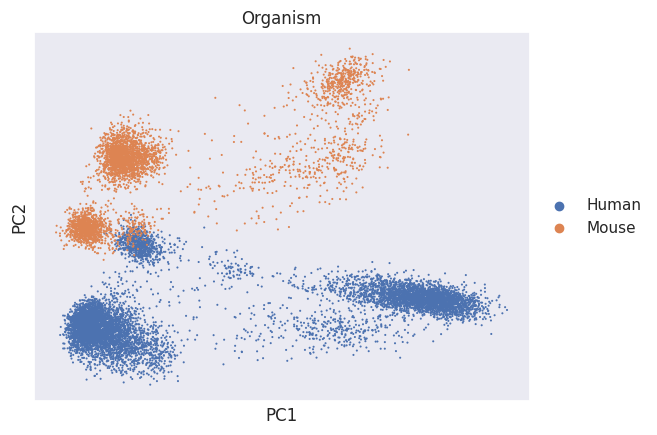

In [32]:
sc.pl.pca(merged_adata, color='Organism', components='1,2')

Хорошее разделение по видам


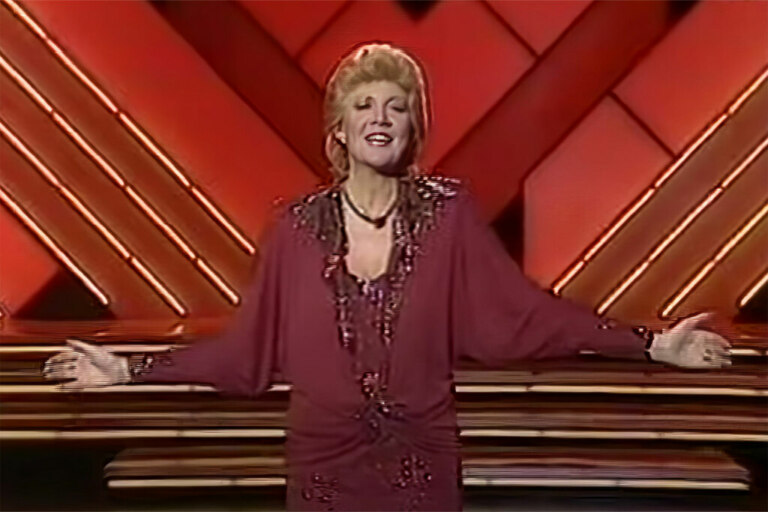

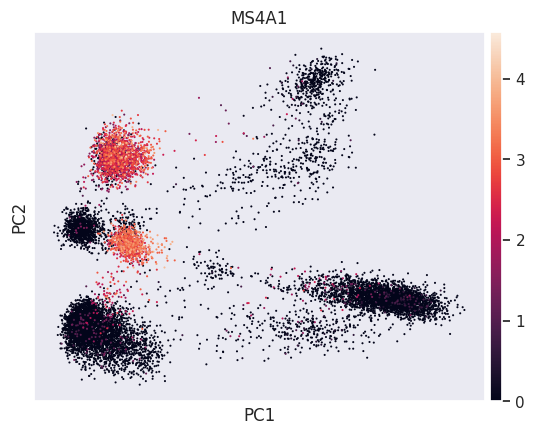

In [33]:
# Посмотрим на В-лимфоциты:
sc.pl.pca(merged_adata, color='MS4A1', components='1,2')

In [34]:
# Построение KNN-графа
sc.pp.neighbors(merged_adata, n_pcs=30, n_neighbors=20)

In [35]:
# Кластеризация и UMAP
sc.tl.umap(merged_adata)
sc.tl.leiden(merged_adata)

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


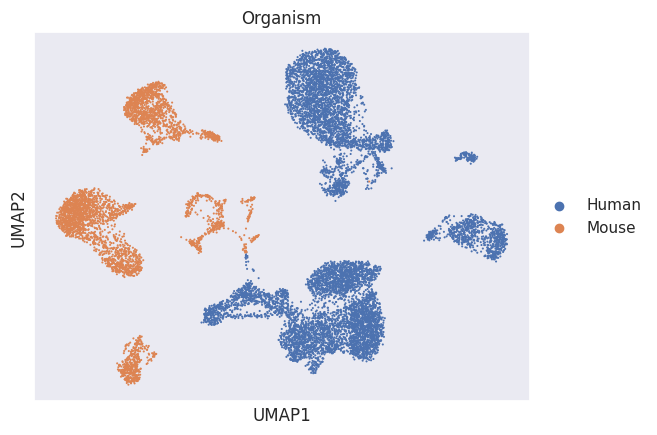

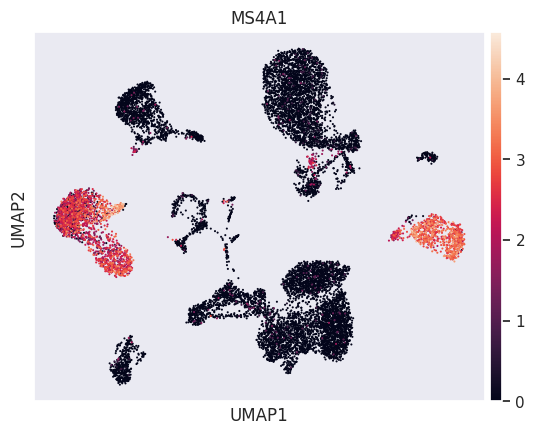

In [36]:
sc.pl.umap(merged_adata, color="Organism")
sc.pl.umap(merged_adata, color="MS4A1")

# Коррекция батч-эффекта

### bbknn

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


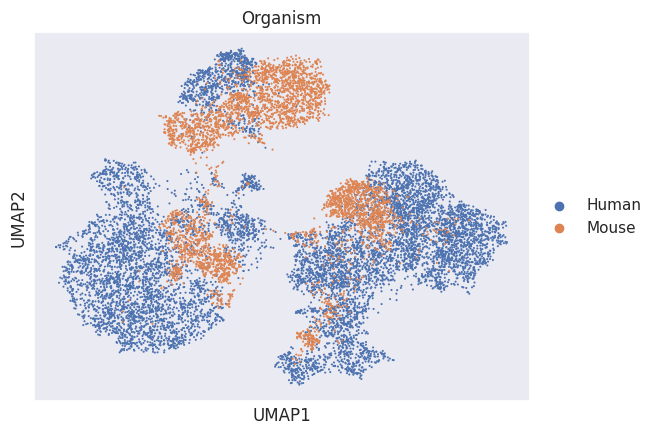

In [37]:
bbknn.bbknn(merged_adata, batch_key='Organism')
sc.tl.umap(merged_adata)
sc.tl.leiden(merged_adata)
sc.pl.umap(merged_adata, color="Organism")

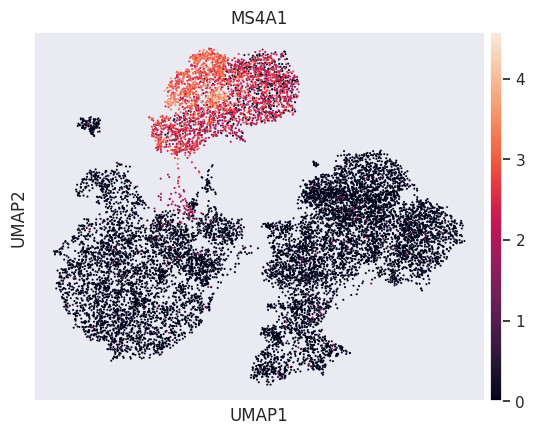

In [39]:
sc.pl.umap(merged_adata, color="MS4A1")

Попробуем использовать harmony и затем bbknn

### harmony + bbknn

In [38]:
# harmony
sce.pp.harmony_integrate(merged_adata, key="Organism", basis="X_pca", max_iter_harmony=20)

2023-12-21 08:28:30,449 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2023-12-21 08:28:36,208 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2023-12-21 08:28:36,303 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2023-12-21 08:28:40,763 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2023-12-21 08:28:46,016 - harmonypy - INFO - Converged after 2 iterations
INFO:harmonypy:Converged after 2 iterations


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


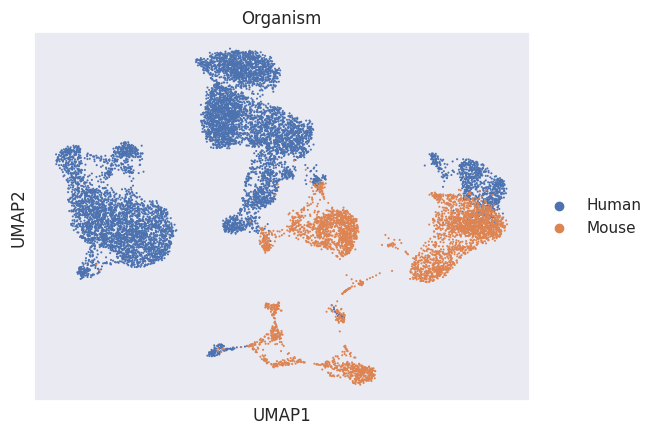

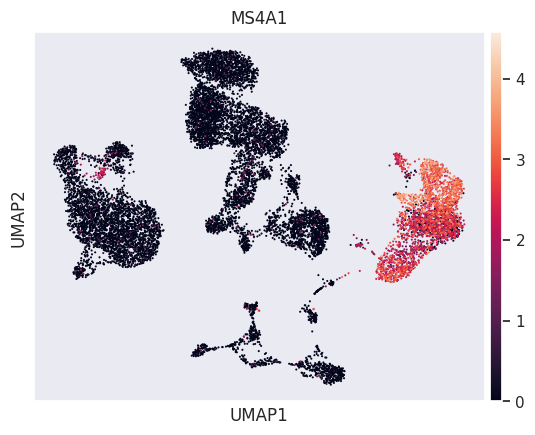

In [39]:
sc.pp.neighbors(merged_adata, n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")
sc.tl.umap(merged_adata)
sc.tl.leiden(merged_adata)
sc.pl.umap(merged_adata, color="Organism")
sc.pl.umap(merged_adata, color="MS4A1")

Коориднаты harmony передаем bbknn

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


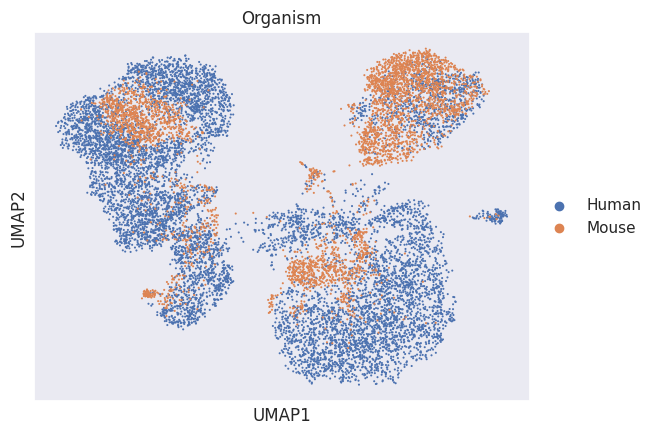

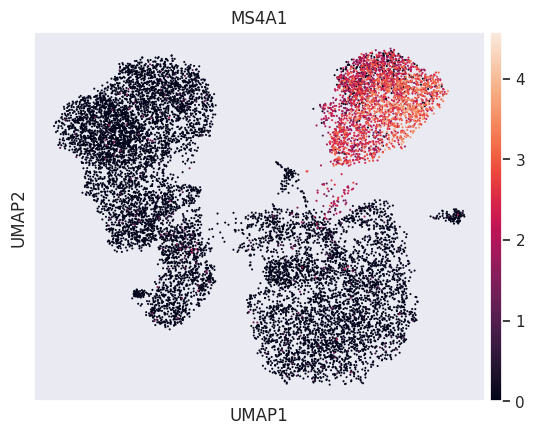

In [40]:
# bbknn на координатах harmony
bbknn.bbknn(merged_adata, use_rep='X_pca_harmony' , batch_key='Organism')
sc.tl.umap(merged_adata)
sc.tl.leiden(merged_adata)
sc.pl.umap(merged_adata, color="Organism")
sc.pl.umap(merged_adata, color="MS4A1")

Выглядит лучше, чем результат работы только harmony или только bbknn. Посмотрим, где лежат дублеты и нужно ли их удалить

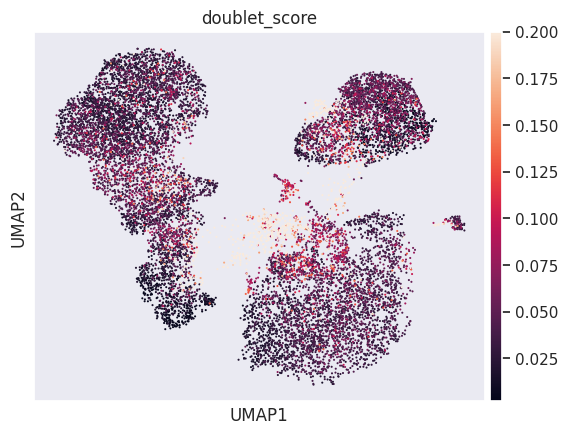

In [43]:
# Визуализация дублетов
sc.pl.umap(merged_adata, color="doublet_score", vmax=0.2)

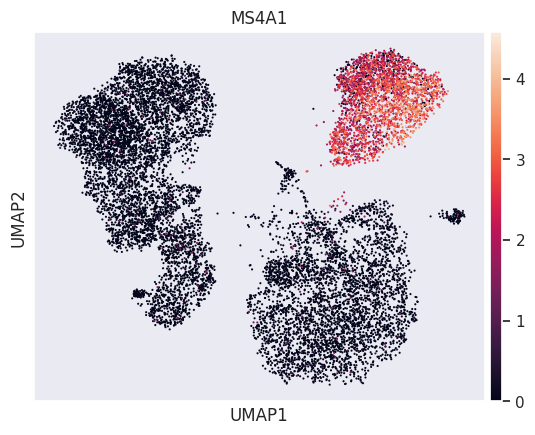

In [41]:
# Удалим дублеты
merged_adata_2 = merged_adata[merged_adata.obs.predicted_doublet == False]
sc.pl.umap(merged_adata_2, color="MS4A1")

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


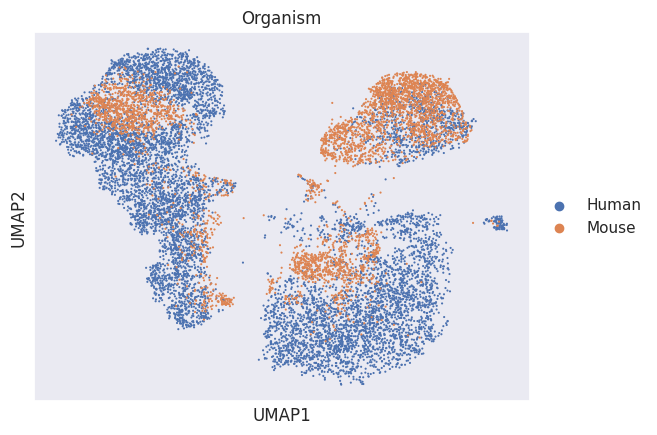

In [50]:
sc.pl.umap(merged_adata_2, color="Organism")

Клетки, несокластеризовавшиеся с группой В-лимфоцитов всё же остались, но их граздо меньше

# Аннотация

#### Маркеры и типы клеток: определение В-, Т4- и Т8-лимфоцитов, дендритных клеток и NK-клеток
MS4A1 - B-cells  
CD3E - T-cells, NK-cells  
NKG7 - NK-cells  
CD4 - monocytes, DC, T-cells  
CD8A - T-cells  
CD14 - monocytes, macrophages  


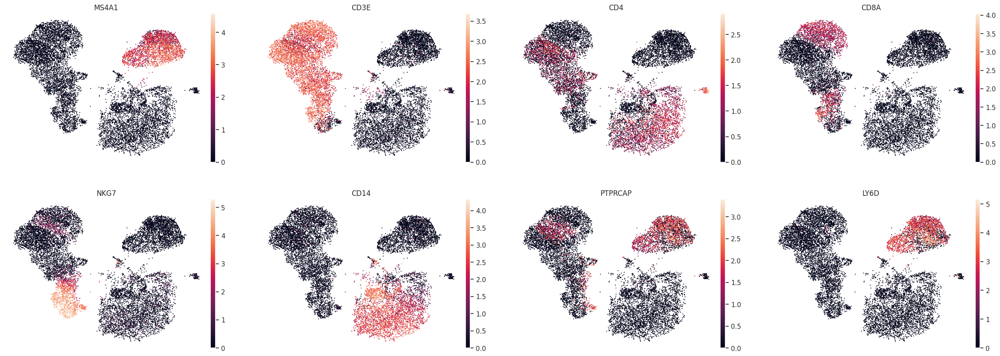

In [45]:
sc.pl.umap(merged_adata_2, color=["MS4A1", "CD3E", "CD4", "CD8A", "NKG7", "CD14", "PTPRCAP", "LY6D"], frameon=False)

Доопледеление дендритных клеток и макрофагов  
MZB1 - B-cells, plasma cells, plasmacytoid dendritic cells (pDCs)   
LRRC26 - plasmacytoid dendritic cells (pDCs)   
CD19 - **B-cells**, plasma cells  
IRF4 - DC  
ITGA2B - erythroid cells   
SELP - activated platelets  
C1QC - intermediate monocytes, macrophages  
MSR1 - macrophages  
S1PR3 - classical monocytes  

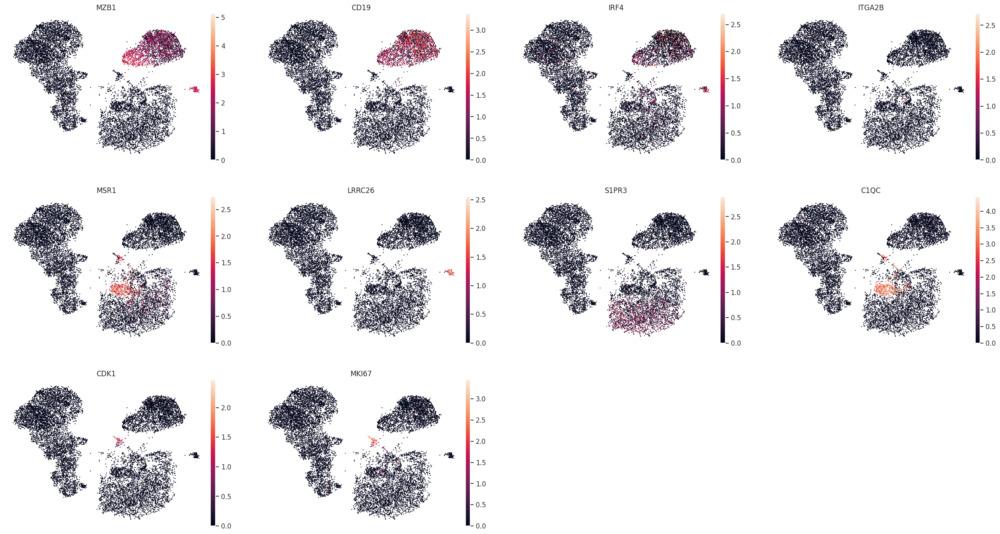

In [47]:
sc.pl.umap(merged_adata_2, color=["MZB1", 'CD19', "IRF4", "ITGA2B", "MSR1", "LRRC26", "S1PR3", "C1QC", "CDK1", "MKI67"], frameon=False)

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_utils.py:431: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


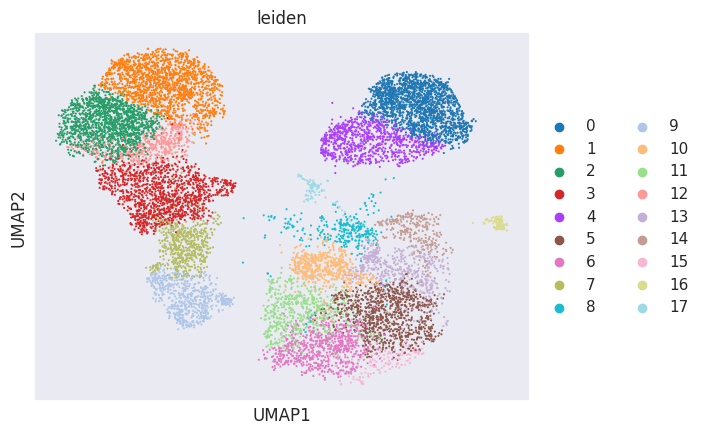

In [48]:
sc.pl.umap(merged_adata_2, color="leiden")

Установим примерный набор генов, экспрессия которых в одних и тех же типах клеток отличается визуально у мыши и человека:

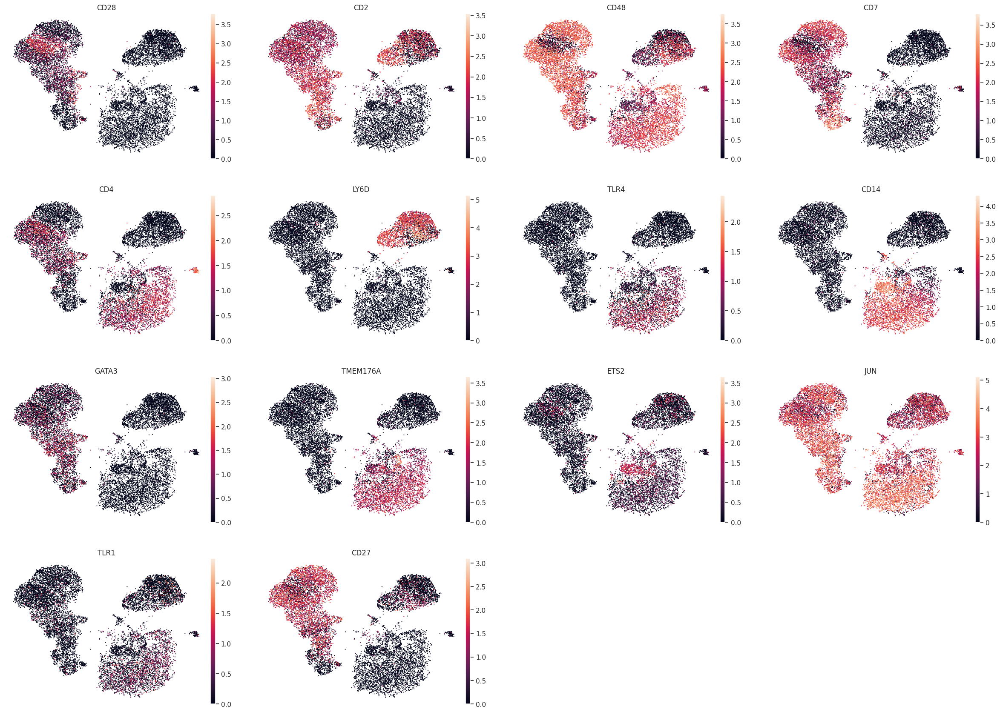

In [49]:
sc.pl.umap(merged_adata_2, color=["CD28", "CD2", "CD48", "CD7", "CD4", "LY6D", "TLR4", "CD14", "GATA3", "TMEM176A", "ETS2", "JUN", "TLR1", "CD27"], frameon=False)

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


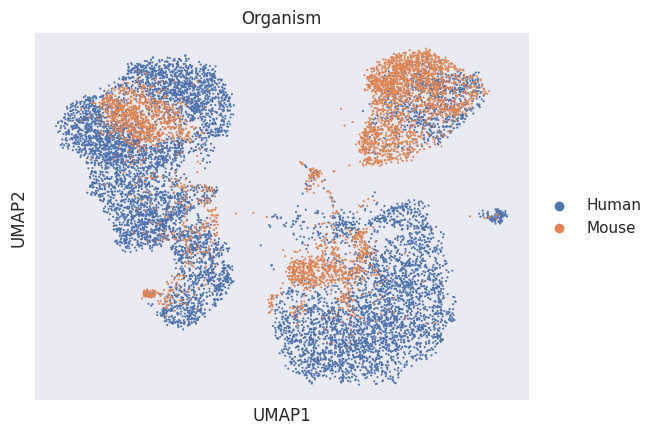

In [ ]:
# для наглядности сравниваем с этим графиком, чтобы понимать, где чьи клетки
sc.pl.umap(merged_adata_2, color="Organism")

2 часть  
Установим примерный набор генов, экспрессия которых в одних и тех же типах клеток отличается визуально у мыши и человека:

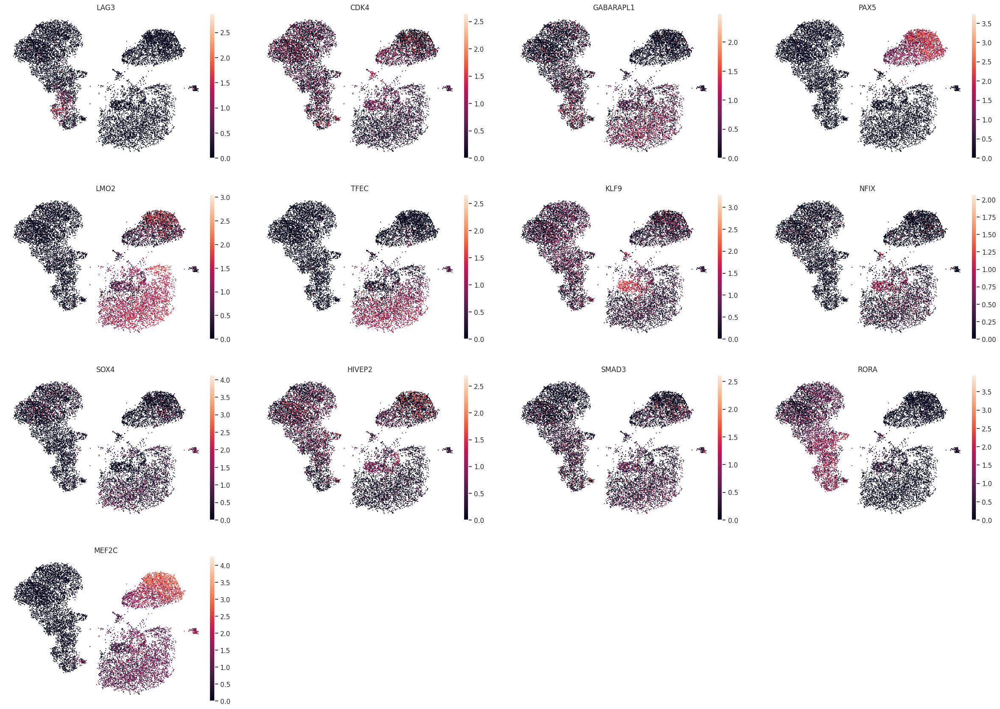

In [204]:
sc.pl.umap(merged_adata_2, color=["LAG3", "CDK4", "GABARAPL1", "PAX5", "LMO2", "TFEC", "KLF9", "NFIX", "SOX4", "HIVEP2", "SMAD3", "RORA", "MEF2C"], frameon=False)

### Аннотация с использованием референса

In [52]:
!pip install scanpy[leiden] symphonypy

  0%|          | 0.00/38.9M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


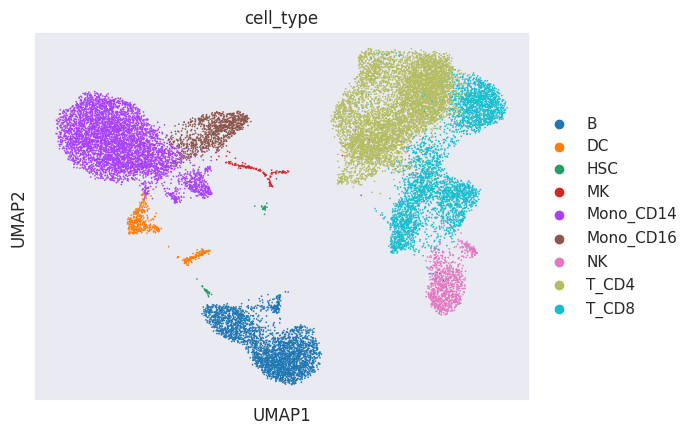

In [53]:
import symphonypy as sp
adata_reference = sp.datasets.pbmcs_10x_reference()
sc.pl.umap(adata_reference, color="cell_type")

In [54]:
sp.tl.map_embedding(merged_adata_2, adata_reference, key="Organism")
sp.tl.per_cell_confidence(merged_adata_2, adata_reference)
sp.tl.transfer_labels_kNN(merged_adata_2, adata_reference, ref_labels=["cell_type"])

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


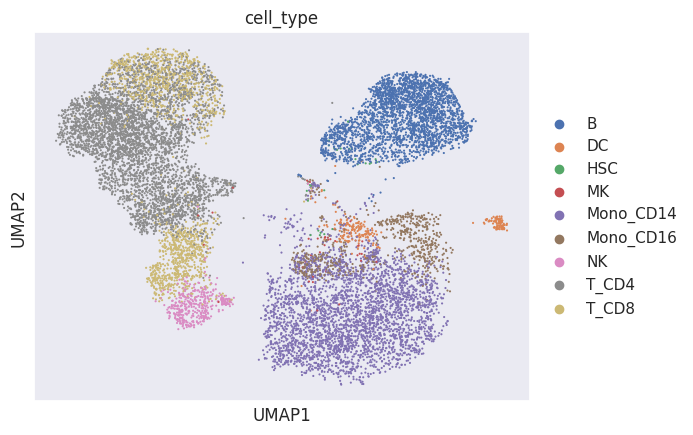

In [55]:
sc.pl.umap(merged_adata_2, color="cell_type")

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


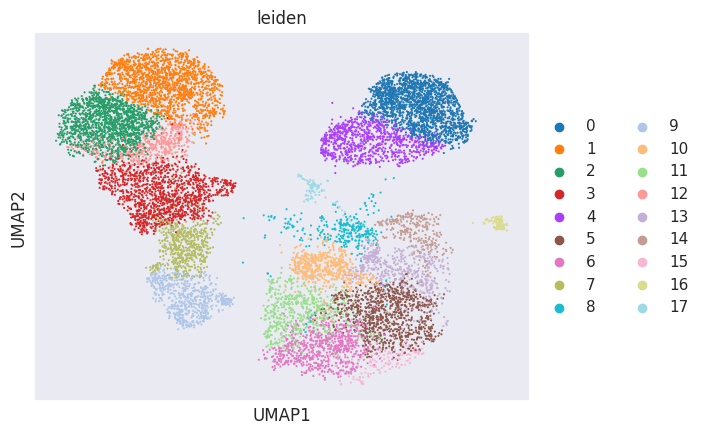

In [56]:
sc.pl.umap(merged_adata_2, color="leiden")

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


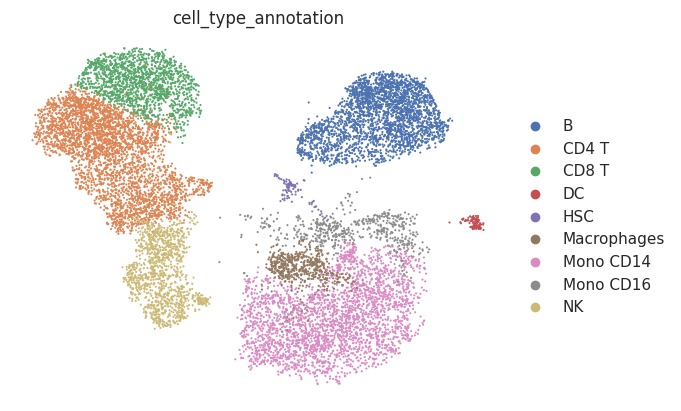

In [57]:
# Ручная разметка
leiden_to_ct = {
    "0": "B",
    "1": "CD8 T",
    "2": "CD4 T",
    "3": "CD4 T",
    "4": "B",
    "5": "Mono CD14",
    "6": "Mono CD14",
    "7": "NK",
    "8": "Mono CD16",
    "9": "NK",
    "10": "Macrophages",
    "11": "Mono CD14",
    "12": "CD4 T",
    "13": "Mono CD14",
    "14": "Mono CD16",
    "15": "Mono CD14",
    "16": "DC",
    "17": "HSC"
}

merged_adata_2.obs["cell_type_annotation"] = [leiden_to_ct[leiden] for leiden in merged_adata_2.obs.leiden]
sc.pl.umap(merged_adata_2, color=["cell_type_annotation"], frameon=False, wspace=0.3)

# Дифференциальная экспрессия

In [58]:
# маркеры найдены в статьях, приведенных ниже

markers = {"B": ["CD48", "LY6D", "CD27", "PAX5", "LMO2"],
           "CD4 T": ["CD28", "CD48", "CD7", "GATA3", "CD27", "RORA"],
           "CD8 T": ["CD28", "CD48", "CD7", "GATA3", "CD27", "RORA"],
           "NK": ["CD7", "CD27", "LAG3", "HIVEP2", "SMAD3", "RORA"],
           "DC": ["CD4", "TMEM176A", "TFEC", "SOX4", "MEF2C"],
           "Mono CD14": ["CD48", "TLR4", "CD14", "ETS2", "TMEM176A", "GABARAPL1", "LMO2", "NFIX"],
           "Mono CD16": ["CD48", "TLR4", "CD14", "ETS2", "TMEM176A", "GABARAPL1", "LMO2", "NFIX"],
           "HSC": ["CDK1", "CDK4", "ETS2", "LMO2", "NFIX"],
           "Macrophages": ["CD14", "ETS2", "NFIX"]
}
# https://doi.org/10.3389/fimmu.2022.867015
# 10.1073/pnas.1222738110

In [59]:
class dif_expr:
    def __init__(self, adata, cell_type, markers):
        self.adata = adata
        self.cell_type = cell_type
        self.markers = markers
        self.adata_celltype = self.adata[self.adata.obs.cell_type_annotation == cell_type]


    def rank_genes(self):
        sc.tl.rank_genes_groups(self.adata_celltype, groupby='Organism')
        sc.tl.filter_rank_genes_groups(self.adata_celltype, min_fold_change=3, compare_abs=True)

        return sc.pl.rank_genes_groups_dotplot(self.adata_celltype, n_genes=16, key='rank_genes_groups_filtered')


    def get_volcano(self):
        self.human = sc.get.rank_genes_groups_df(self.adata_celltype, group='Human')
        self.human_sign =  self.human[(abs(self.human.logfoldchanges) > 3) & (self.human.pvals_adj < 0.001) ]

        return sns.scatterplot(self.human_sign, x=self.human_sign.logfoldchanges, y = -np.log(self.human_sign.pvals_adj))


    def dataframe(self):
        return self.human


    def mark_heatmap(self):
        return sc.pl.heatmap(self.adata_celltype, self.markers[self.cell_type], groupby='Organism', swap_axes=True)

## B-cells

Найденные гены:


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


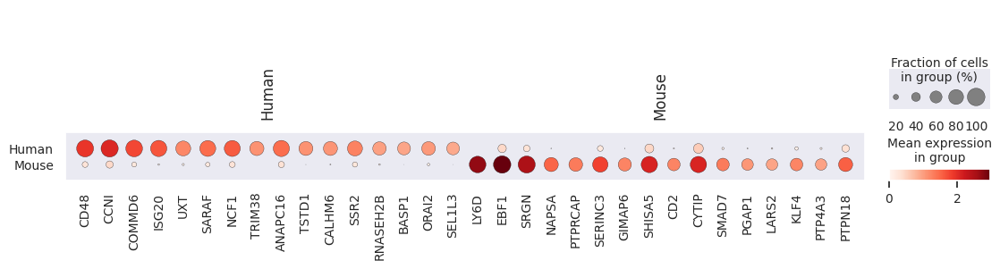

Тепловая карта для генов, найденных в статьях: 


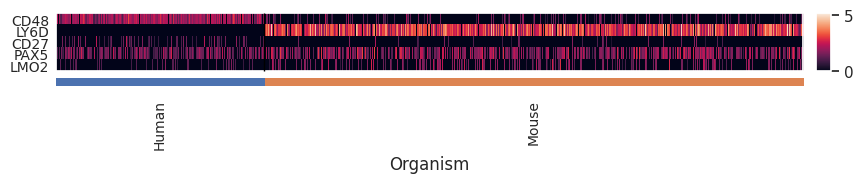

Volcano plot


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='logfoldchanges', ylabel='pvals_adj'>

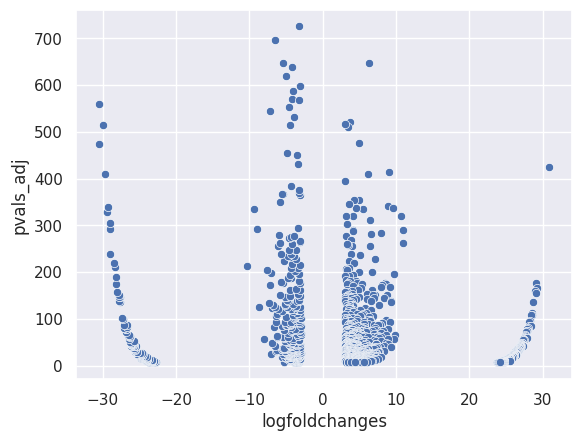

In [60]:
B_cells = dif_expr(merged_adata_2, "B", markers)
print('Найденные гены:')
B_cells.rank_genes()
print('Тепловая карта для генов, найденных в статьях: ')
B_cells.mark_heatmap()
print('Volcano plot')
B_cells.get_volcano()

## T-cells

### T4

Найденные гены:


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


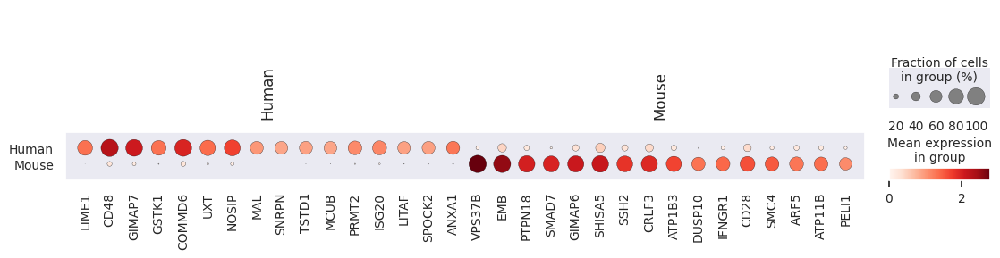

Тепловая карта для генов, найденных в статьях: 


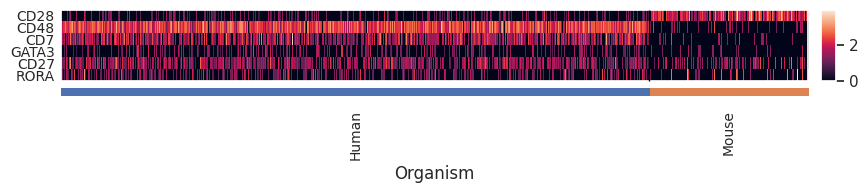

Volcano plot


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='logfoldchanges', ylabel='pvals_adj'>

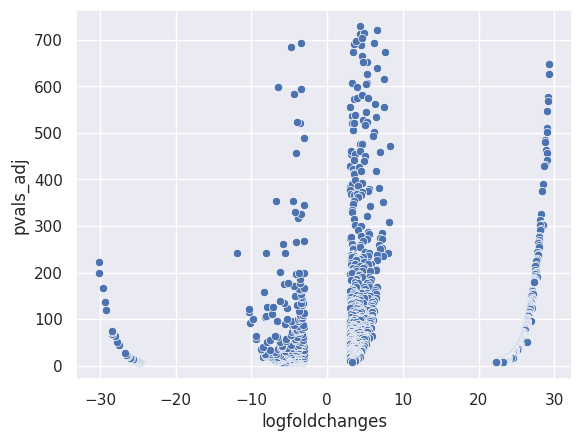

In [61]:
T4_cells = dif_expr(merged_adata_2, "CD4 T", markers)
print('Найденные гены:')
T4_cells.rank_genes()
print('Тепловая карта для генов, найденных в статьях: ')
T4_cells.mark_heatmap()
print('Volcano plot')
T4_cells.get_volcano()

### T8

Найденные гены:


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


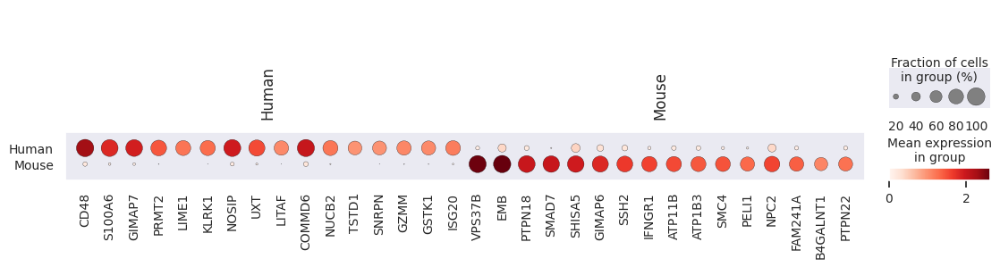

Тепловая карта для генов, найденных в статьях: 


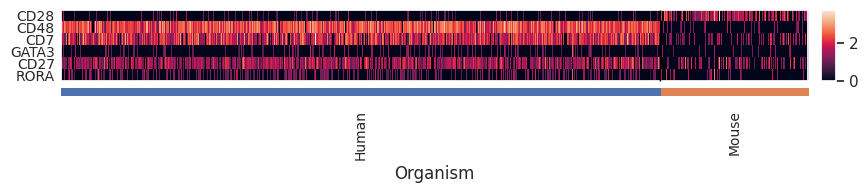

Volcano plot


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='logfoldchanges', ylabel='pvals_adj'>

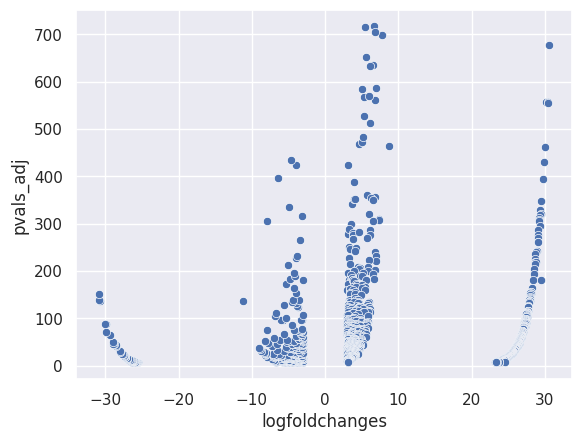

In [62]:
T8_cells = dif_expr(merged_adata_2, "CD8 T", markers)
print('Найденные гены:')
T8_cells.rank_genes()
print('Тепловая карта для генов, найденных в статьях: ')
T8_cells.mark_heatmap()
print('Volcano plot')
T8_cells.get_volcano()

## NK

Найденные гены:


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


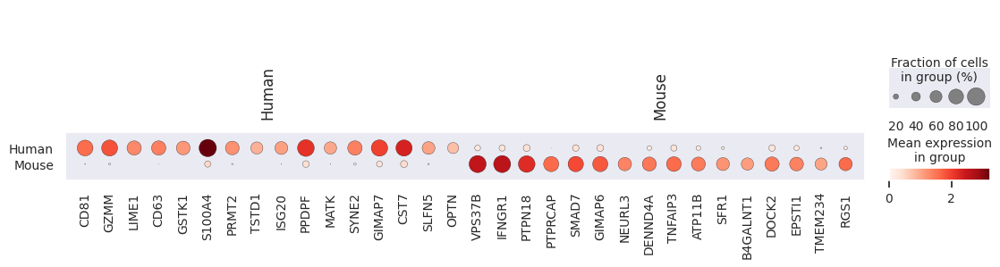

Тепловая карта для генов, найденных в статьях: 


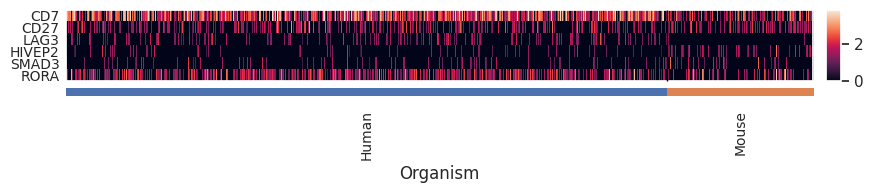

Volcano plot


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='logfoldchanges', ylabel='pvals_adj'>

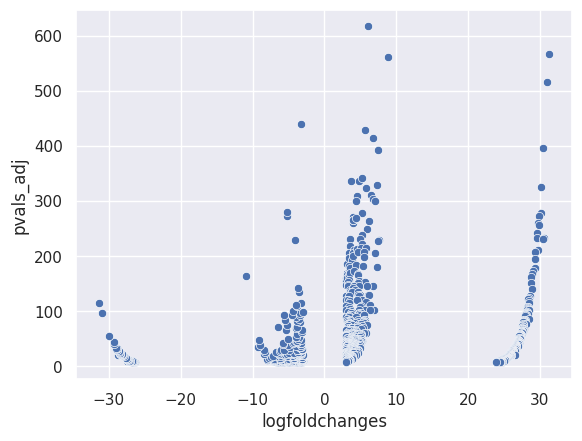

In [63]:
NK_cells = dif_expr(merged_adata_2, "NK", markers)
print('Найденные гены:')
NK_cells.rank_genes()
print('Тепловая карта для генов, найденных в статьях: ')
NK_cells.mark_heatmap()
print('Volcano plot')
NK_cells.get_volcano()

## Monocytes

### CD14 Monocytes

Найденные гены:


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


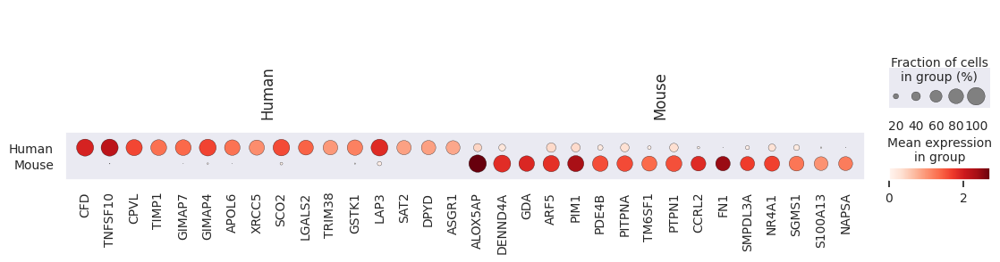

Тепловая карта для генов, найденных в статьях: 


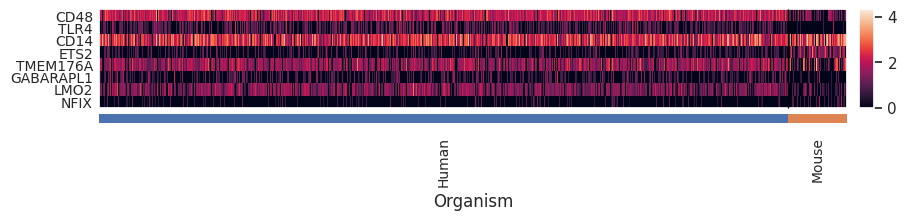

Volcano plot


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='logfoldchanges', ylabel='pvals_adj'>

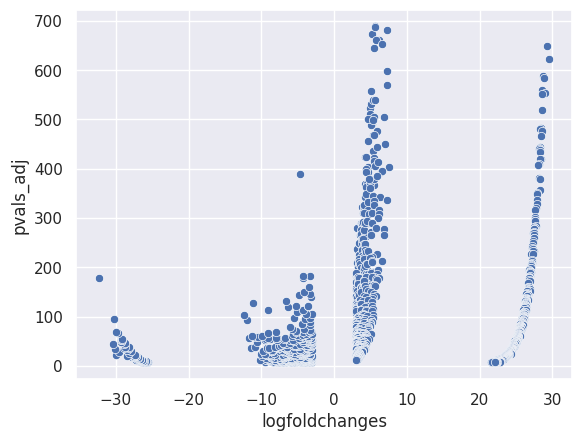

In [ ]:
MO14_cells = dif_expr(merged_adata_2, "Mono CD14", markers)
print('Найденные гены:')
MO14_cells.rank_genes()
print('Тепловая карта для генов, найденных в статьях: ')
MO14_cells.mark_heatmap()
print('Volcano plot')
MO14_cells.get_volcano()

### CD16 Monocytes

Найденные гены:


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


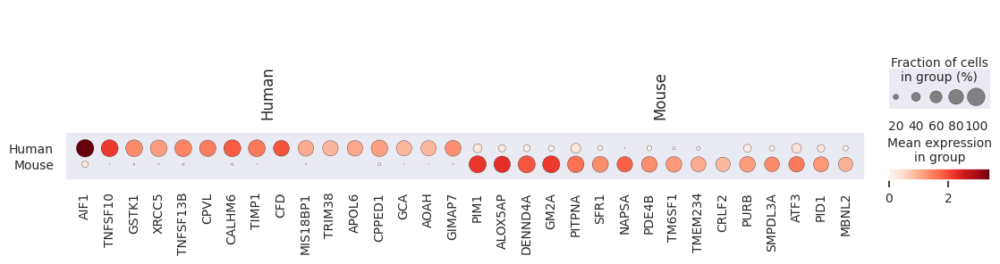

Тепловая карта для генов, найденных в статьях: 


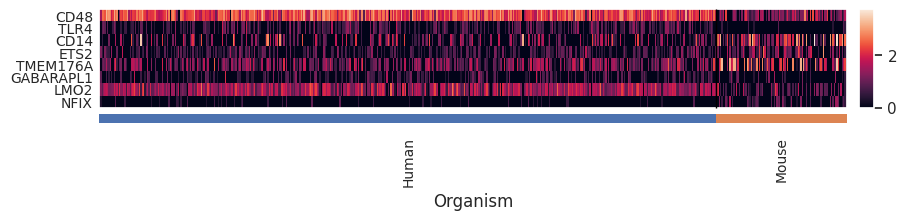

Volcano plot


<Axes: xlabel='logfoldchanges', ylabel='pvals_adj'>

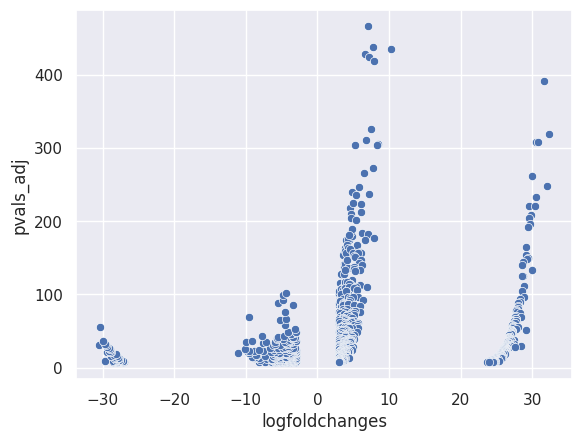

In [64]:
MO16_cells = dif_expr(merged_adata_2, "Mono CD16", markers)
print('Найденные гены:')
MO16_cells.rank_genes()
print('Тепловая карта для генов, найденных в статьях: ')
MO16_cells.mark_heatmap()
print('Volcano plot')
MO16_cells.get_volcano()

## DC

Найденные гены:


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


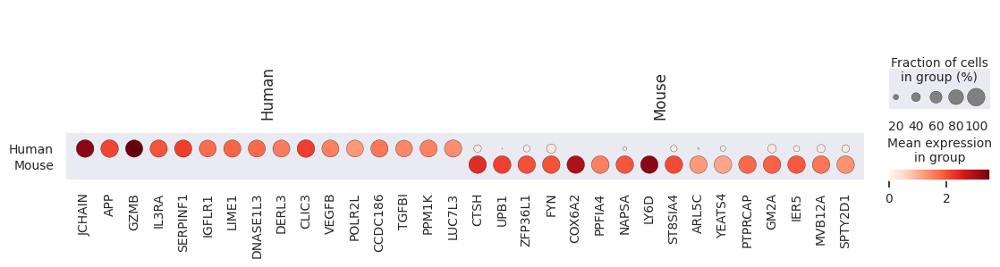

Тепловая карта для генов, найденных в статьях: 


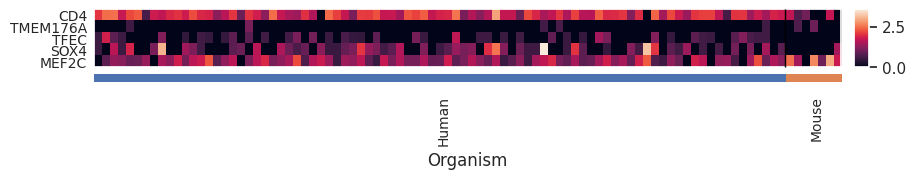

Volcano plot


<Axes: xlabel='logfoldchanges', ylabel='pvals_adj'>

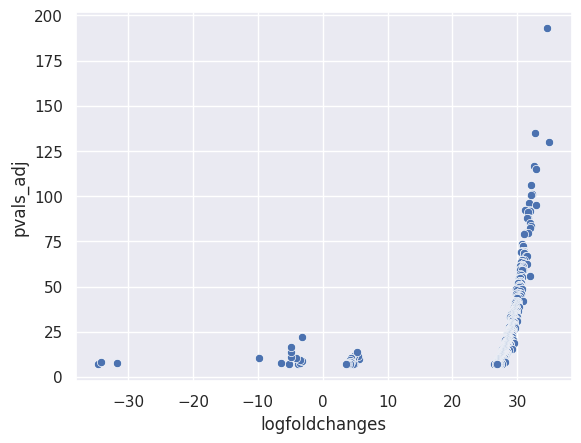

In [ ]:
D_cells = dif_expr(merged_adata_2, "DC", markers)
print('Найденные гены:')
D_cells.rank_genes()
print('Тепловая карта для генов, найденных в статьях: ')
D_cells.mark_heatmap()
print('Volcano plot')
D_cells.get_volcano()

## HSC

Найденные гены:


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


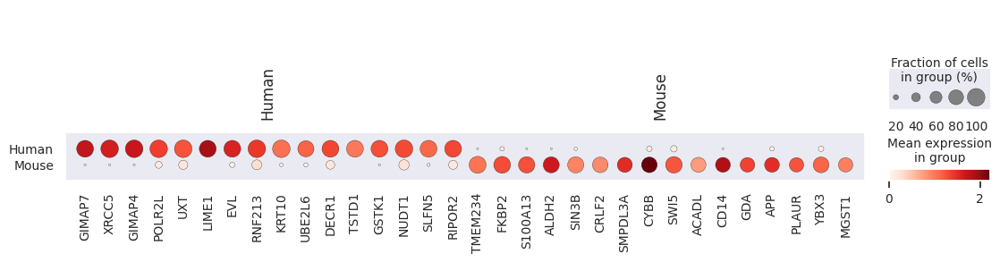

Тепловая карта для генов, найденных в статьях: 


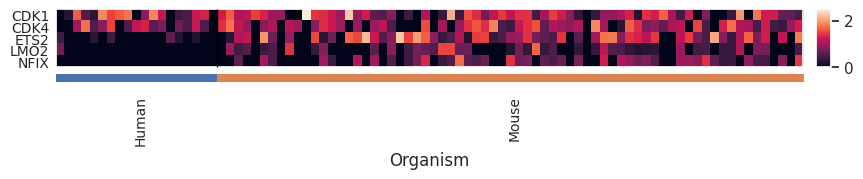

Volcano plot


<Axes: xlabel='logfoldchanges', ylabel='pvals_adj'>

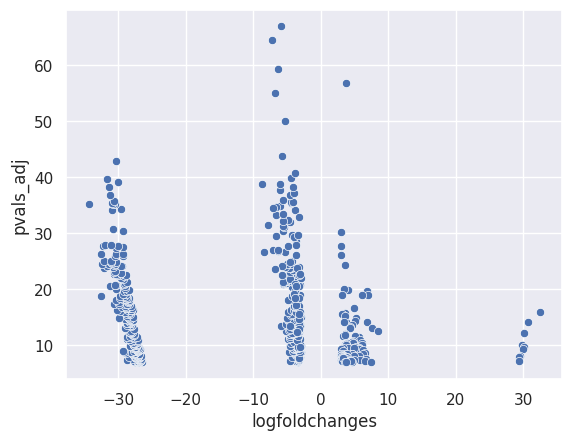

In [65]:
HS_cells = dif_expr(merged_adata_2, "HSC", markers)
print('Найденные гены:')
HS_cells.rank_genes()
print('Тепловая карта для генов, найденных в статьях: ')
HS_cells.mark_heatmap()
print('Volcano plot')
HS_cells.get_volcano()

## Macrophages

Найденные гены:


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


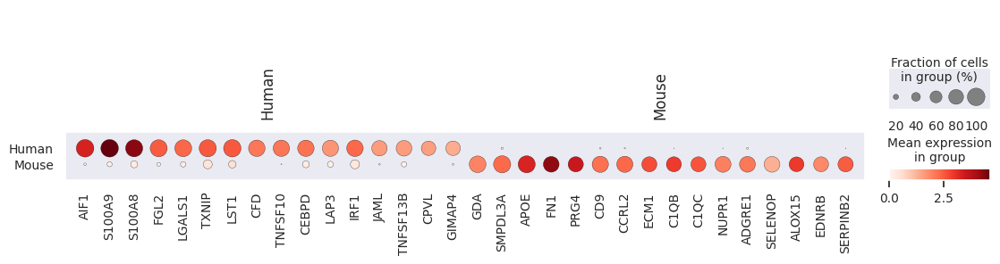

Тепловая карта для генов, найденных в статьях: 


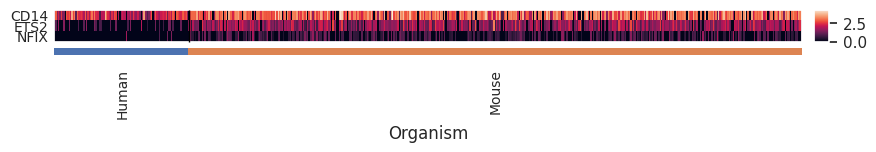

Volcano plot


<Axes: xlabel='logfoldchanges', ylabel='pvals_adj'>

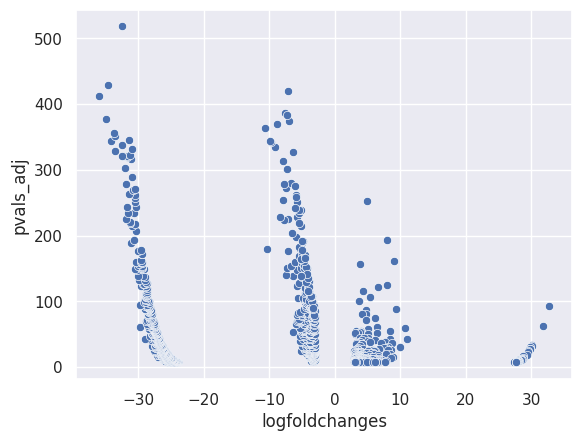

In [66]:
Macro_cells = dif_expr(merged_adata_2, "Macrophages", markers)
print('Найденные гены:')
Macro_cells.rank_genes()
print('Тепловая карта для генов, найденных в статьях: ')
Macro_cells.mark_heatmap()
print('Volcano plot')
Macro_cells.get_volcano()

# GSEA

In [67]:
!pip install gseapy
from gseapy.plot import gseaplot
import gseapy as gp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 7.1 MB/s eta 0:00:00


In [68]:
gp.get_library_name()

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_10x_scRNA_2021',
 'Allen_Brain_Atlas_down',
 'Allen_Brain_Atlas_up',
 'Azimuth_2023',
 'Azimuth_Cell_Types_2021',
 'BioCarta_2013',
 'BioCarta_2015',
 'BioCarta_2016',
 'BioPlanet_2019',
 'BioPlex_2017',
 'CCLE_Proteomics_2020',
 'CORUM',
 'COVID-19_Related_Gene_Sets',
 'COVID-19_Related_Gene_Sets_2021',
 'Cancer_Cell_Line_Encyclopedia',
 'CellMarker_Augmented_2021',
 'ChEA_2013',
 'ChEA_2015',
 'ChEA_2016',
 'ChEA_2022',
 'Chromosome_Location',
 'Chromosome_Location_hg19',
 'ClinVar_2019',
 'DSigDB',
 'Data_Acquisition_Method_Most_Popular_Genes',
 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019',
 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019',
 'Descartes_Cell_Types_and_Tissue_2021',
 'Diabetes_Perturbations_GEO_2022',
 'DisG

In [69]:
def final_dataframe(pre_res):
        out = []
        for term in list(pre_res.results):
            out.append([term,
                      pre_res.results[term]['fdr'],
                      pre_res.results[term]['es'],
                      pre_res.results[term]['nes']])

        out_df = pd.DataFrame(out, columns = ['Term','fdr', 'es', 'nes']).sort_values('fdr').reset_index(drop = True)
        return out_df

class gsea:
    def __init__(self, adata, cell_type, organism):
        self.adata = adata
        self.cell_type = cell_type
        self.adata_celltype = self.adata[self.adata.obs.cell_type_annotation == cell_type]
        self.organism = organism

    def ranking(self):
        sc.tl.rank_genes_groups(self.adata_celltype, groupby='Organism')
        sc.tl.filter_rank_genes_groups(self.adata_celltype, min_fold_change=3, compare_abs=True)

        if self.organism == 'Human':
            self.human = sc.get.rank_genes_groups_df(self.adata_celltype, group='Human')

            # оставляем статистически значимые значения и значения с экспрессией, изменённой в 2 раза
            self.human_sign = self.human[(abs(self.human['logfoldchanges']) > 1) & (self.human['pvals_adj'] < 0.05)]

            # ранжирование и сортировка по рангу
            # человек
            self.human_sign['Rank'] = -np.log10(self.human_sign.pvals_adj)*self.human_sign.logfoldchanges
            self.human_sign = self.human_sign.sort_values('Rank', ascending = False).reset_index(drop = True)
          # print(self.human_sign)

            # оставляем только имена генов и ранги
            self.ranking_h = self.human_sign[['names', 'Rank']]
            self.pre_res_h = gp.prerank(rnk = self.ranking_h, gene_sets = 'GO_Biological_Process_2023', seed = 42, permutation_num = 100)

            return final_dataframe(self.pre_res_h)

        elif self.organism == 'Mouse':
            self.mouse = sc.get.rank_genes_groups_df(self.adata_celltype, group='Mouse')

            # оставляем статистически значимые значения и значения с экспрессией, изменённой в 2 раза
            self.mouse_sign = self.mouse[abs(self.mouse['logfoldchanges']) > 1  & (self.mouse['pvals_adj'] < 0.05)]

            # ранжирование и сортировка по рангу
            # мышь
            self.mouse_sign['Rank'] = -np.log10(self.mouse_sign.pvals_adj)*self.mouse_sign.logfoldchanges
            self.mouse_sign = self.mouse_sign.sort_values('Rank', ascending = False).reset_index(drop = True)

            # оставляем только имена генов и ранги

            self.ranking_m = self.mouse_sign[['names', 'Rank']]
            self.pre_res_m = gp.prerank(rnk = self.ranking_m, gene_sets = 'GO_Biological_Process_2023', seed = 42, permutation_num = 100)

            return final_dataframe(self.pre_res_m)

        else:
            return 'Error'

    def plots_h(self):
        self.terms_h = self.pre_res_h.res2d.Term
        self.pre_res_h.plot(self.terms_h[:3], show_ranking=False, legend_kws={'loc': (1.05, 0)}, )

        return

    def plots_m(self):
        self.terms_m = self.pre_res_m.res2d.Term
        self.pre_res_m.plot(self.terms_m[:3], show_ranking=False, legend_kws={'loc': (1.05, 0)}, )
        return


## B-cells

### Человек

In [70]:
B_cells_h = gsea(merged_adata_2, "B", 'Human')
B_cells_h.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-69-19c01dfcf2a5>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.human_sign['Rank'] = -np.log10(self.human_sign.pvals_adj)*self.human_sign.logfoldchanges
2023-12-20 21:58:13,512 [WARNING] Input gene rankings contains inf values!
2023-12-20 21:58:13,517 [WARNING] Duplicated values found in preranked stats: 0.58% of genes
The order of those genes wi

,Term,fdr,es,nes
0,Glucose Homeostasis (GO:0042593),0.112976,0.917884,1.892018
1,TOR Signaling (GO:0031929),0.210888,0.907140,1.810889
2,Ribosomal Large Subunit Biogenesis (GO:0042273),0.248547,0.920154,1.817050
3,Translational Elongation (GO:0006414),0.263610,0.914060,1.790901
4,Ribosome Assembly (GO:0042255),0.286205,0.922878,1.828622
...,...,...,...,...
931,Neuron Migration (GO:0001764),1.000000,0.356724,0.692080
932,Negative Regulation Of Catabolic Process (GO:0...,1.000000,0.675064,1.352106
933,Skeletal System Development (GO:0001501),1.000000,0.414151,0.846981
934,Peptide Biosynthetic Process (GO:0043043),1.000000,0.558249,1.206421


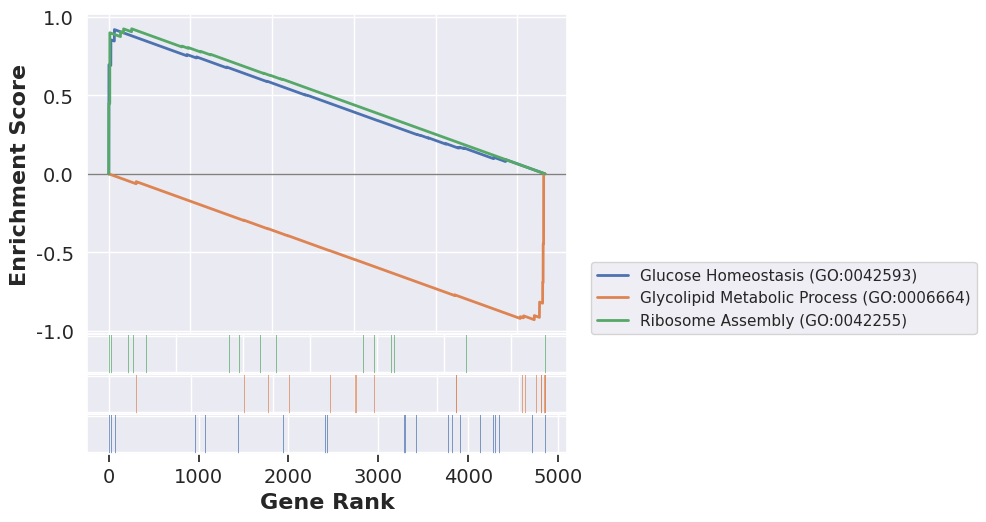

In [192]:
B_cells_h.plots_h()

### Мышь

In [71]:
B_cells_m = gsea(merged_adata_2, "B", 'Mouse')
B_cells_m.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-69-19c01dfcf2a5>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.mouse_sign['Rank'] = -np.log10(self.mouse_sign.pvals_adj)*self.mouse_sign.logfoldchanges
2023-12-20 21:59:18,435 [WARNING] Input gene rankings contains inf values!
2023-12-20 21:59:18,437 [WARNING] Duplicated values found in preranked stats: 3.83% of genes
The order of those genes wi

,Term,fdr,es,nes
0,Ribosomal Large Subunit Biogenesis (GO:0042273),0.101805,-0.931944,-1.785038
1,Intracellular Iron Ion Homeostasis (GO:0006879),0.131172,-0.906248,-1.736653
2,Regulation Of Receptor-Mediated Endocytosis (G...,0.148792,-0.923389,-1.740564
3,RNA Catabolic Process (GO:0006401),0.175418,-0.855907,-1.716866
4,Negative Regulation Of Ubiquitin-Dependent Pro...,0.191864,-0.957959,-1.743545
...,...,...,...,...
1721,Cytoplasmic Microtubule Organization (GO:0031122),1.000000,-0.704622,-1.331153
1722,Regulation Of Chromosome Organization (GO:0033...,1.000000,-0.639835,-1.210876
1723,ERBB Signaling Pathway (GO:0038127),1.000000,-0.559080,-1.064491
1724,Regulation Of Cation Channel Activity (GO:2001...,1.000000,-0.688216,-1.169728


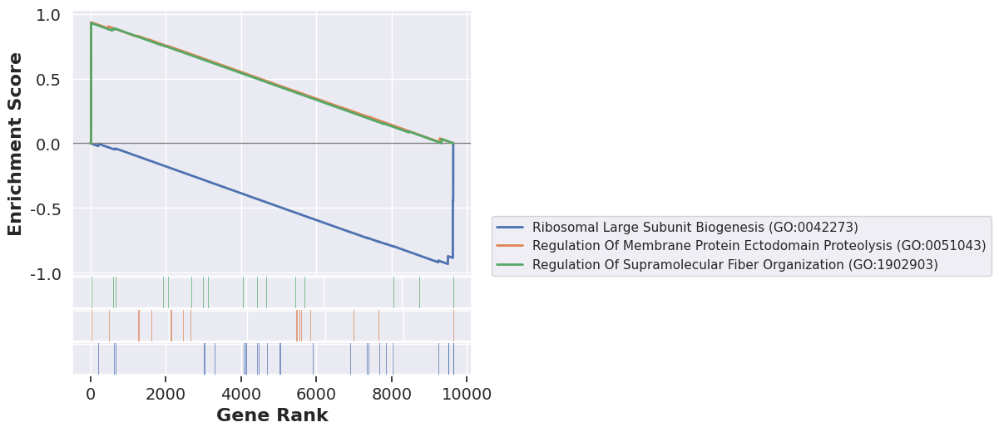

In [72]:
B_cells_m.plots_m()

## T-cells

### CD4

In [73]:
T4_cells_h = gsea(merged_adata_2, "CD4 T", 'Human')
T4_cells_h.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-69-19c01dfcf2a5>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.human_sign['Rank'] = -np.log10(self.human_sign.pvals_adj)*self.human_sign.logfoldchanges
2023-12-20 22:01:16,502 [WARNING] Input gene rankings contains inf values!
2023-12-20 22:01:16,504 [WARNING] Duplicated values found in preranked stats: 0.73% of genes
The order of those genes wi

,Term,fdr,es,nes
0,Ribosomal Small Subunit Biogenesis (GO:0042274),0.090000,-0.815088,-1.878555
1,Negative Regulation Of MAP Kinase Activity (GO...,0.097500,-0.760359,-1.916469
2,Protein Dephosphorylation (GO:0006470),0.097500,-0.704437,-1.850833
3,ncRNA Processing (GO:0034470),0.120000,-0.682829,-1.953807
4,Cytoplasmic Translation (GO:0002181),0.171429,-0.912704,-1.741591
...,...,...,...,...
1049,Receptor-Mediated Endocytosis (GO:0006898),1.000000,-0.231563,-0.631964
1050,Regulation Of Proteasomal Ubiquitin-Dependent ...,1.000000,0.592114,0.988289
1051,Negative Regulation Of Intracellular Signal Tr...,1.000000,0.405463,0.681021
1052,Regulation Of Mitochondrial Translation (GO:00...,1.000000,0.438037,0.700778


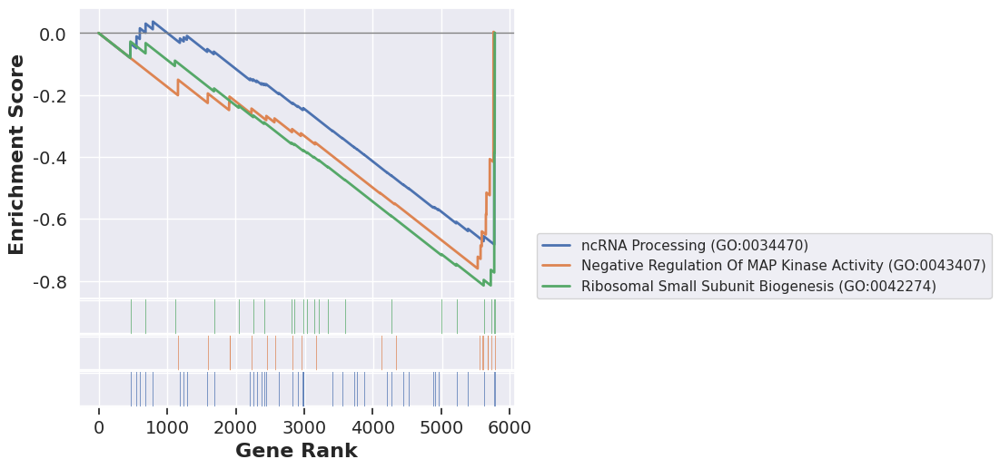

In [195]:
T4_cells_h.plots_h()

In [74]:
T4_cells_m = gsea(merged_adata_2, "CD4 T", 'Mouse')
T4_cells_m.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-69-19c01dfcf2a5>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.mouse_sign['Rank'] = -np.log10(self.mouse_sign.pvals_adj)*self.mouse_sign.logfoldchanges
2023-12-20 22:02:52,143 [WARNING] Input gene rankings contains inf values!
2023-12-20 22:02:52,146 [WARNING] Duplicated values found in preranked stats: 2.78% of genes
The order of those genes wi

,Term,fdr,es,nes
0,Negative Regulation Of mRNA Catabolic Process ...,0.000000,0.890112,2.124049
1,Cell-Substrate Junction Assembly (GO:0007044),0.016171,0.838912,2.014129
2,Maturation Of SSU-rRNA From Tricistronic rRNA ...,0.025873,0.920624,1.908715
3,Peptidyl-Tyrosine Dephosphorylation (GO:0035335),0.028299,0.874356,1.923864
4,Regulation Of Chromosome Segregation (GO:0051983),0.032341,0.806455,1.942043
...,...,...,...,...
1772,Regulation Of Glucose Metabolic Process (GO:00...,1.000000,-0.777698,-1.140497
1773,Cytokine-Mediated Signaling Pathway (GO:0019221),1.000000,-0.431663,-0.657791
1774,Epidermis Development (GO:0008544),1.000000,-0.596933,-0.924771
1775,Mesoderm Formation (GO:0001707),1.000000,-0.532356,-0.793612


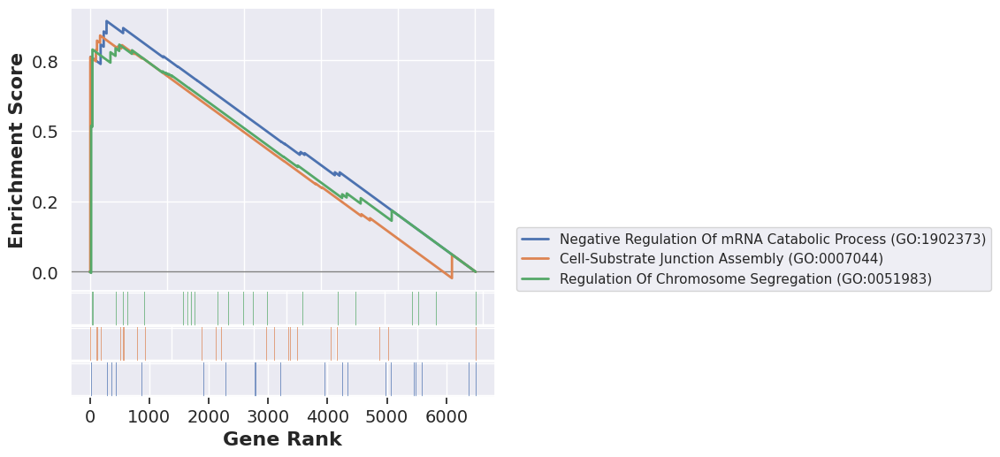

In [155]:
T4_cells_m.plots_m()

### CD8

In [75]:
T8_cells_h = gsea(merged_adata_2, "CD8 T", 'Human')
T8_cells_h.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-69-19c01dfcf2a5>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.human_sign['Rank'] = -np.log10(self.human_sign.pvals_adj)*self.human_sign.logfoldchanges
2023-12-20 22:04:22,246 [WARNING] Input gene rankings contains inf values!
2023-12-20 22:04:22,248 [WARNING] Duplicated values found in preranked stats: 0.16% of genes
The order of those genes wi

,Term,fdr,es,nes
0,Ceramide Biosynthetic Process (GO:0046513),0.000000,-0.813848,-2.116476
1,Positive Regulation Of Endothelial Cell Migrat...,0.108941,0.960667,1.591791
2,Negative Regulation Of Protein Ubiquitination ...,0.124108,-0.785322,-1.853277
3,RNA Polymerase II Preinitiation Complex Assemb...,0.127098,0.922601,1.579364
4,Plasma Membrane Bounded Cell Projection Morpho...,0.157956,-0.863144,-1.792935
...,...,...,...,...
877,Negative Regulation Of Protein-Containing Comp...,1.000000,0.796614,1.262081
878,Cellular Response To Light Stimulus (GO:0071482),1.000000,0.738920,1.152004
879,DNA-templated Transcription Initiation (GO:000...,1.000000,0.349356,0.582199
880,Mitochondrial Transport (GO:0006839),1.000000,0.344014,0.550787


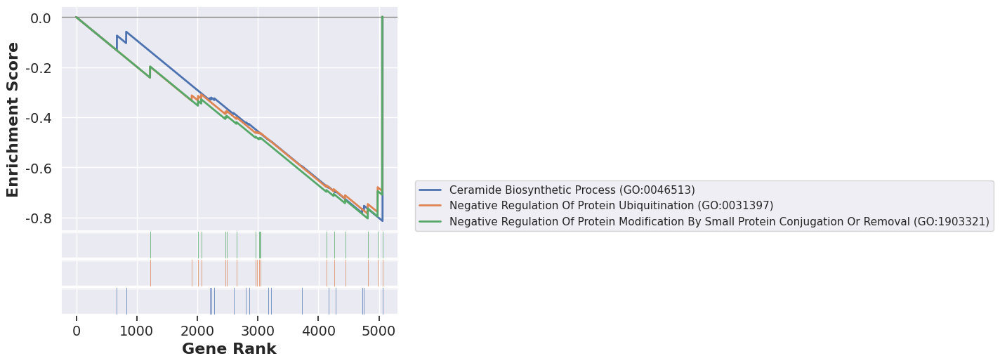

In [157]:
T8_cells_h.plots_h()

In [76]:
T8_cells_m = gsea(merged_adata_2, "CD8 T", 'Mouse')
T8_cells_m.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-69-19c01dfcf2a5>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.mouse_sign['Rank'] = -np.log10(self.mouse_sign.pvals_adj)*self.mouse_sign.logfoldchanges
2023-12-20 22:05:12,234 [WARNING] Input gene rankings contains inf values!
2023-12-20 22:05:12,236 [WARNING] Duplicated values found in preranked stats: 4.74% of genes
The order of those genes wi

,Term,fdr,es,nes
0,T Cell Receptor Signaling Pathway (GO:0050852),0.000000,0.785197,1.937420
1,Focal Adhesion Assembly (GO:0048041),0.018020,0.899302,1.925437
2,Glycosphingolipid Metabolic Process (GO:0006687),0.022525,0.854551,1.903540
3,Cytoplasmic Translation (GO:0002181),0.030034,0.812015,1.908574
4,Positive Regulation Of Oxidoreductase Activity...,0.036041,0.856982,1.859830
...,...,...,...,...
1788,Negative Regulation Of Protein Kinase Activity...,1.000000,-0.660152,-1.008858
1789,Regulation Of DNA Damage Checkpoint (GO:2000001),1.000000,-0.622942,-0.936934
1790,mRNA 3'-End Processing (GO:0031124),1.000000,-0.608853,-0.931790
1791,Protein Polymerization (GO:0051258),1.000000,-0.609884,-0.902960


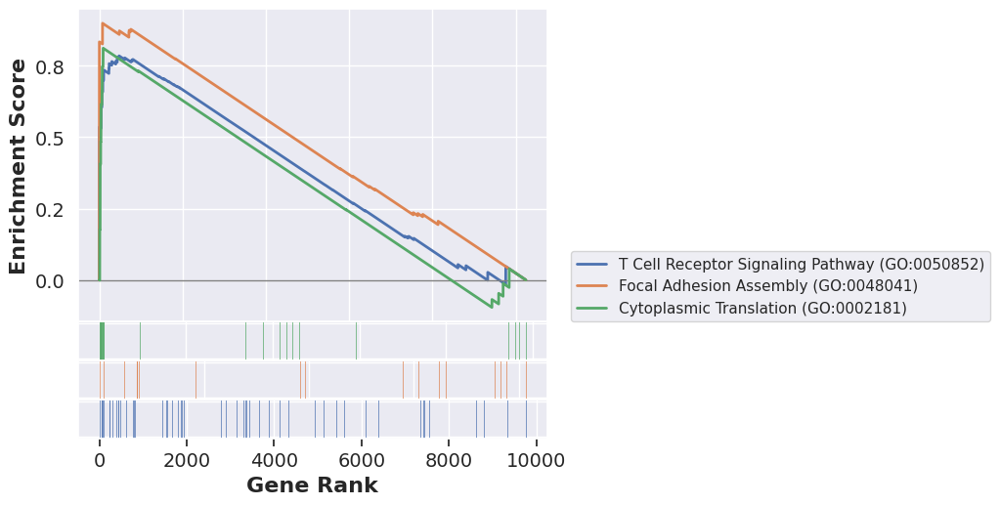

In [159]:
T8_cells_m.plots_m()

## NK cells

In [77]:
NK_cells_h = gsea(merged_adata_2, "NK", 'Human')
NK_cells_h.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-69-19c01dfcf2a5>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.human_sign['Rank'] = -np.log10(self.human_sign.pvals_adj)*self.human_sign.logfoldchanges
2023-12-20 22:06:29,497 [WARNING] Input gene rankings contains inf values!
2023-12-20 22:06:29,499 [WARNING] Duplicated values found in preranked stats: 0.02% of genes
The order of those genes wi

,Term,fdr,es,nes
0,Glycolipid Metabolic Process (GO:0006664),0.038393,-0.686285,-2.104322
1,Positive Regulation Of Protein Catabolic Proce...,0.354211,0.858085,1.525072
2,Positive Regulation Of B Cell Activation (GO:0...,0.361376,0.902436,1.533154
3,Positive Regulation Of Intracellular Protein T...,0.397312,0.860109,1.525143
4,B Cell Receptor Signaling Pathway (GO:0050853),0.420038,0.937657,1.533311
...,...,...,...,...
825,Negative Regulation Of Growth (GO:0045926),1.000000,0.631357,1.096377
826,Actomyosin Structure Organization (GO:0031032),1.000000,0.602161,1.008616
827,Positive Regulation Of Cell Differentiation (G...,1.000000,0.480904,0.810330
828,Positive Regulation Of Macromolecule Metabolic...,1.000000,0.351221,0.599979


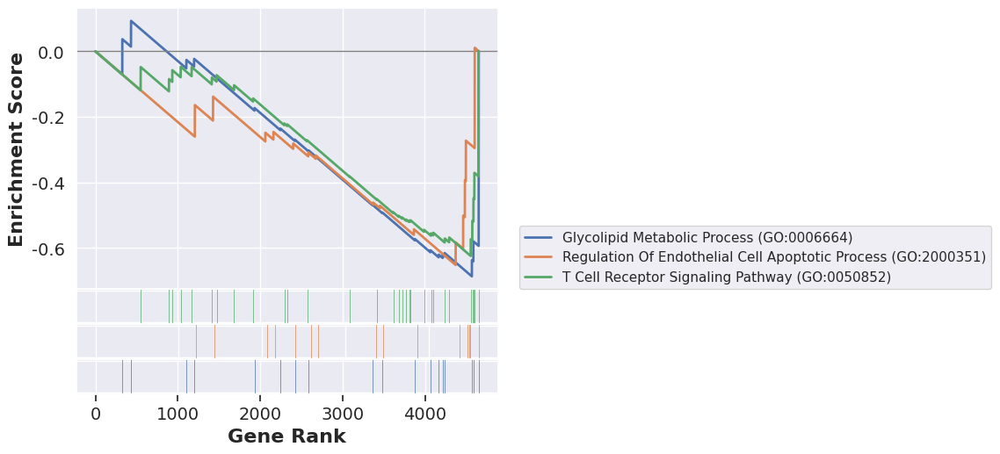

In [161]:
NK_cells_h.plots_h()

In [78]:
NK_cells_m = gsea(merged_adata_2, "NK", 'Mouse')
NK_cells_m.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-69-19c01dfcf2a5>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.mouse_sign['Rank'] = -np.log10(self.mouse_sign.pvals_adj)*self.mouse_sign.logfoldchanges
2023-12-20 22:07:10,639 [WARNING] Input gene rankings contains inf values!
2023-12-20 22:07:10,641 [WARNING] Duplicated values found in preranked stats: 5.61% of genes
The order of those genes wi

,Term,fdr,es,nes
0,Cell-Substrate Junction Assembly (GO:0007044),0.123743,0.865762,1.832540
1,Negative Regulation Of Axonogenesis (GO:0050771),0.146363,0.787938,1.786267
2,tRNA Aminoacylation For Protein Translation (G...,0.149024,0.908679,1.843806
3,Focal Adhesion Assembly (GO:0048041),0.166055,0.865439,1.790951
4,NIK/NF-kappaB Signaling (GO:0038061),0.215552,0.858086,1.849625
...,...,...,...,...
1832,GPI Anchor Metabolic Process (GO:0006505),1.000000,-0.814092,-1.243042
1833,Regulation Of Transforming Growth Factor Beta ...,1.000000,-0.451808,-0.694554
1834,Positive Regulation Of Supramolecular Fiber Or...,1.000000,-0.590584,-0.922973
1835,Visual System Development (GO:0150063),1.000000,0.472166,0.877730


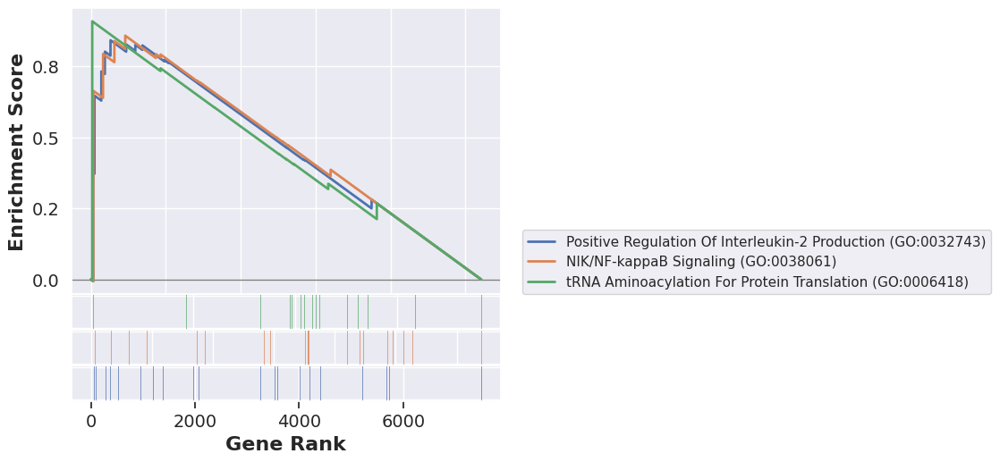

In [163]:
NK_cells_m.plots_m()

## HSC

In [79]:
HS_cells_h = gsea(merged_adata_2, "HSC", 'Human')
HS_cells_h.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
<ipython-input-69-19c01dfcf2a5>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.human_sign['Rank'] = -np.log10(self.human_sign.pvals_adj)*self.human_sign.logfoldchanges


,Term,fdr,es,nes
0,protein-RNA Complex Assembly (GO:0022618),0.000000,0.640155,2.158126
1,Telomere Maintenance (GO:0000723),0.023457,0.614188,1.863652
2,mRNA Processing (GO:0006397),0.026063,0.621460,1.728506
3,"RNA Splicing, Via Transesterification Reaction...",0.026063,0.621460,1.728506
4,Telomere Organization (GO:0032200),0.028148,0.641577,1.684280
...,...,...,...,...
466,Protein Homooligomerization (GO:0051260),1.000000,-0.262472,-0.463017
467,DNA Repair (GO:0006281),1.000000,-0.276150,-0.483180
468,Cilium Organization (GO:0044782),1.000000,0.293676,0.766174
469,Mitochondrial Translation (GO:0032543),1.000000,0.230347,0.695225


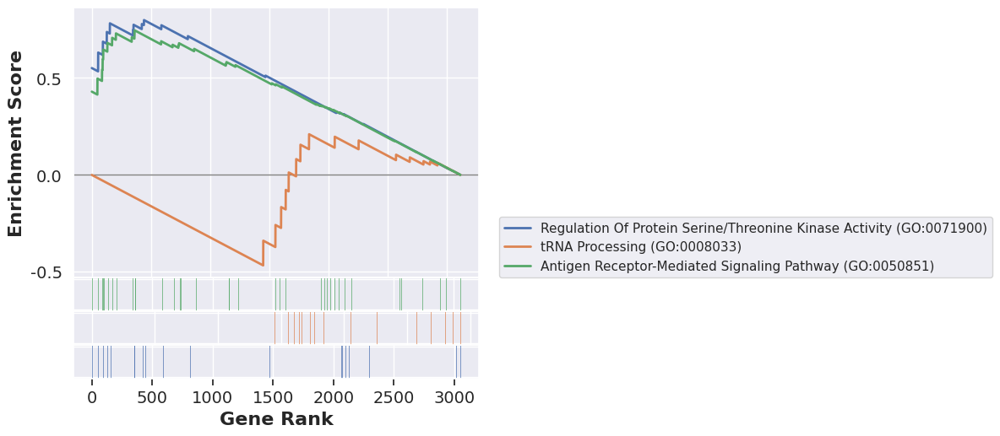

In [106]:
HS_cells_h.plots_h()

In [80]:
HS_cells_m = gsea(merged_adata_2, "HSC", 'Mouse')
HS_cells_m.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
<ipython-input-69-19c01dfcf2a5>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.mouse_sign['Rank'] = -np.log10(self.mouse_sign.pvals_adj)*self.mouse_sign.logfoldchanges
2023-12-20 22:09:43,839 [WARNING] Duplicated values found in preranked stats: 15.46% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,fdr,es,nes
0,Telomere Organization (GO:0032200),0.000000,-0.714076,-1.949228
1,"mRNA Splicing, Via Spliceosome (GO:0000398)",0.043627,-0.620913,-1.860641
2,RNA Methylation (GO:0001510),0.103873,-0.674302,-1.751026
3,Mitochondrial Respiratory Chain Complex Assemb...,0.112183,-0.622957,-1.756851
4,Telomere Maintenance (GO:0000723),0.121532,-0.693626,-1.771268
...,...,...,...,...
1916,DNA Replication Initiation (GO:0006270),1.000000,-0.292539,-0.589058
1917,Regulation Of mRNA Processing (GO:0050684),1.000000,0.365222,0.576939
1918,Histone H2A Acetylation (GO:0043968),1.000000,0.324168,0.480092
1919,Phospholipid Translocation (GO:0045332),1.000000,-0.411283,-0.811234


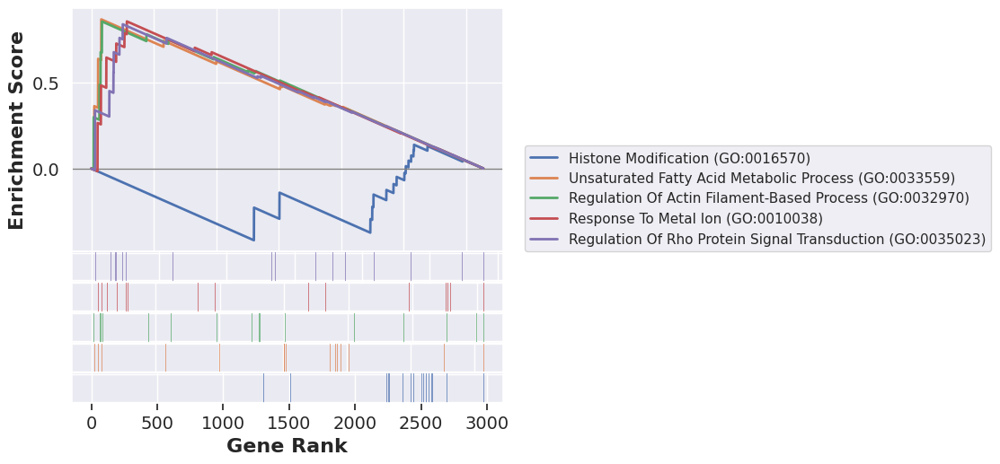

In [93]:
HS_cells_m.plots_m()

## DC

In [81]:
DC_cells_h = gsea(merged_adata_2, "DC", 'Human')
DC_cells_h.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
<ipython-input-69-19c01dfcf2a5>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.human_sign['Rank'] = -np.log10(self.human_sign.pvals_adj)*self.human_sign.logfoldchanges


,Term,fdr,es,nes
0,Neuron Projection Morphogenesis (GO:0048812),0.009989,0.784897,1.742367
1,Cytoplasmic Translation (GO:0002181),0.011811,-0.388424,-1.467721
2,Regulation Of JNK Cascade (GO:0046328),0.019979,0.744334,1.692301
3,RNA Splicing (GO:0008380),0.023308,0.805734,1.698174
4,Skeletal System Development (GO:0001501),0.029968,0.785710,1.702327
...,...,...,...,...
428,Lymphocyte Differentiation (GO:0030098),0.989784,0.259527,0.545199
429,Positive Regulation Of Cytoskeleton Organizati...,0.993283,0.242661,0.514171
430,Cellular Response To Organonitrogen Compound (...,0.997884,0.207360,0.456096
431,Positive Regulation Of Organelle Assembly (GO:...,0.998031,-0.176491,-1.000000


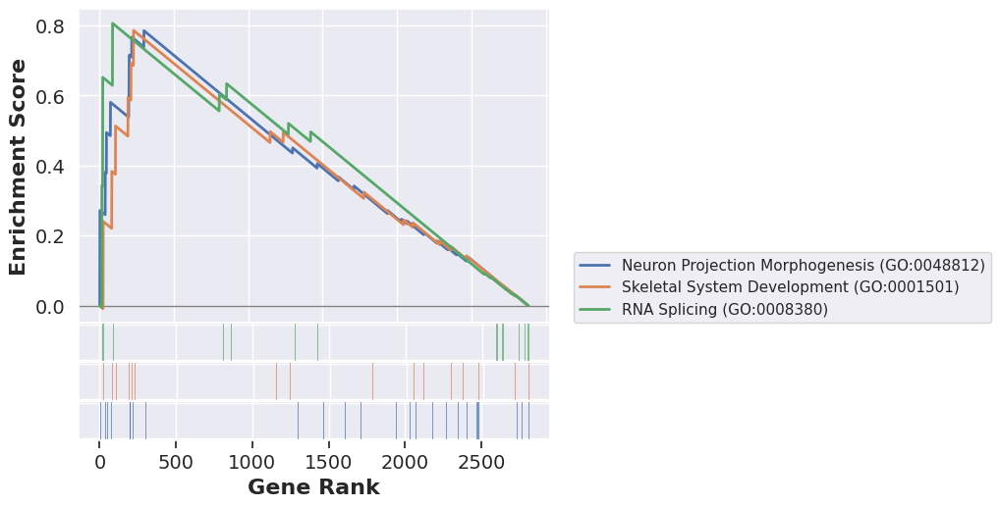

In [168]:
DC_cells_h.plots_h()

In [82]:
DC_cells_m = gsea(merged_adata_2, "DC", 'Mouse')
DC_cells_m.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
<ipython-input-69-19c01dfcf2a5>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.mouse_sign['Rank'] = -np.log10(self.mouse_sign.pvals_adj)*self.mouse_sign.logfoldchanges
2023-12-20 22:12:34,263 [WARNING] Duplicated values found in preranked stats: 21.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,fdr,es,nes
0,Positive Regulation Of Telomere Maintenance Vi...,0.009981,-0.963423,-1.352337
1,Lamellipodium Assembly (GO:0030032),0.019961,-0.950812,-1.336986
2,Positive Regulation Of Transforming Growth Fac...,0.021625,-0.975713,-1.330416
3,Positive Regulation Of Cellular Response To Tr...,0.021625,-0.975713,-1.330416
4,Positive Regulation Of Establishment Of Protei...,0.022813,-0.970111,-1.328721
...,...,...,...,...
1795,Protein Mannosylation (GO:0035268),1.000000,-0.618456,-0.874554
1796,Aortic Valve Development (GO:0003176),1.000000,-0.645570,-0.891373
1797,Regulation Of Cyclin-Dependent Protein Serine/...,1.000000,-0.594948,-0.839514
1798,Negative Regulation Of I-kappaB kinase/NF-kapp...,1.000000,-0.637085,-0.892432


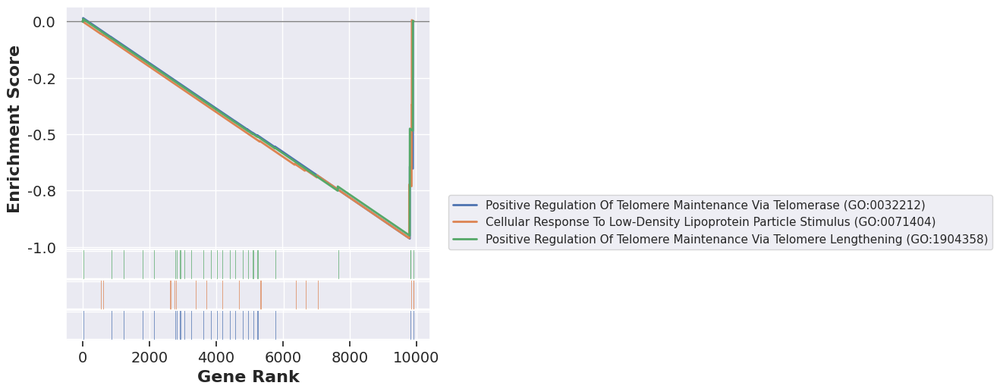

In [170]:
DC_cells_m.plots_m()

## Monocytes

### CD14

In [83]:
Mono14_cells_h = gsea(merged_adata_2, "Mono CD14", 'Human')
Mono14_cells_h.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-69-19c01dfcf2a5>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.human_sign['Rank'] = -np.log10(self.human_sign.pvals_adj)*self.human_sign.logfoldchanges
2023-12-20 22:13:54,990 [WARNING] Input gene rankings contains inf values!
2023-12-20 22:13:54,991 [WARNING] Duplicated values found in preranked stats: 0.66% of genes
The order of those genes wi

,Term,fdr,es,nes
0,B Cell Differentiation (GO:0030183),0.097361,-0.492392,-1.819177
1,Ceramide Biosynthetic Process (GO:0046513),0.129815,-0.686221,-2.033122
2,Negative Regulation Of Neuron Projection Devel...,0.129815,-0.567610,-1.835264
3,Regulation Of Telomerase Activity (GO:0051972),0.133649,0.925790,1.501427
4,Negative Regulation Of mRNA Catabolic Process ...,0.162269,-0.631874,-1.858952
...,...,...,...,...
1005,Positive Regulation Of Protein Polymerization ...,1.000000,0.493295,0.718831
1006,Positive Regulation Of Programmed Cell Death (...,1.000000,0.777905,1.142680
1007,Regulation Of TOR Signaling (GO:0032006),1.000000,0.476195,0.719056
1008,Negative Regulation Of Binding (GO:0051100),1.000000,0.392420,0.577226


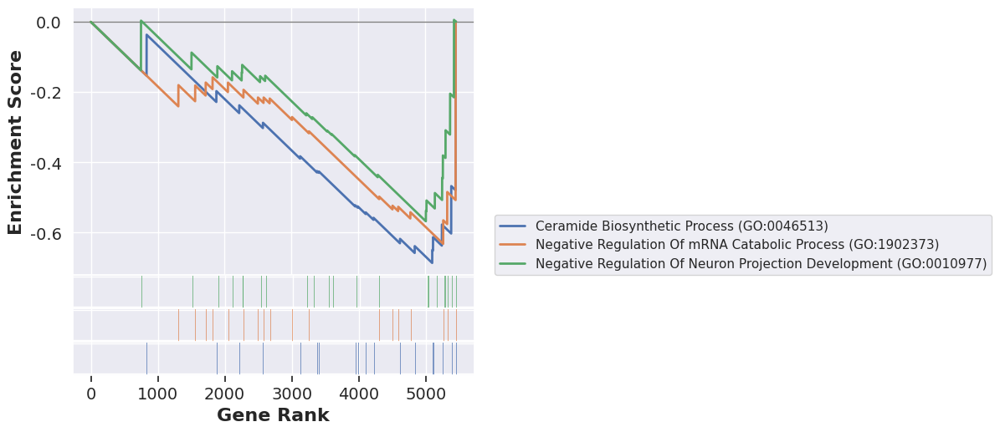

In [173]:
Mono14_cells_h.plots_h()

In [84]:
Mono14_cells_m = gsea(merged_adata_2, "Mono CD14", 'Mouse')
Mono14_cells_m.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-69-19c01dfcf2a5>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.mouse_sign['Rank'] = -np.log10(self.mouse_sign.pvals_adj)*self.mouse_sign.logfoldchanges
2023-12-20 22:14:11,661 [WARNING] Input gene rankings contains inf values!
2023-12-20 22:14:11,663 [WARNING] Duplicated values found in preranked stats: 2.57% of genes
The order of those genes wi

,Term,fdr,es,nes
0,Regulation Of Lipid Storage (GO:0010883),0.000000,0.853752,2.053063
1,Regulation Of Neuroinflammatory Response (GO:0...,0.024179,0.851087,1.986409
2,"Retrograde Vesicle-Mediated Transport, Golgi T...",0.026866,0.778404,1.955446
3,Positive Regulation Of Monooxygenase Activity ...,0.028209,0.785207,1.933839
4,Regulation Of Nitric-Oxide Synthase Activity (...,0.058030,0.772734,1.865249
...,...,...,...,...
1806,Negative Regulation Of Blood Vessel Endothelia...,1.000000,-0.540678,-0.759213
1807,Peptide Metabolic Process (GO:0006518),1.000000,-0.789786,-1.116135
1808,Regulation Of Microtubule Polymerization (GO:0...,1.000000,-0.491761,-0.702063
1809,Regulation Of Ubiquitin-Protein Transferase Ac...,1.000000,-0.665914,-0.973723


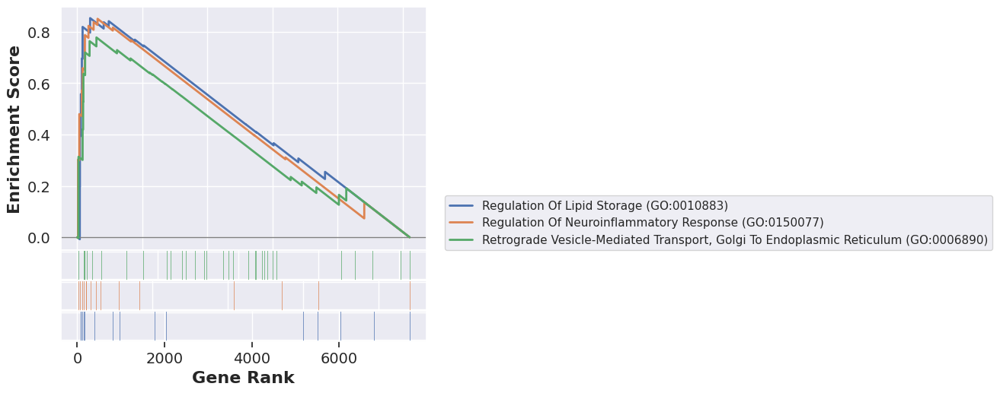

In [174]:
Mono14_cells_m.plots_m()

### CD16

In [85]:
Mono16_cells_h = gsea(merged_adata_2, "Mono CD16", 'Human')
Mono16_cells_h.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
<ipython-input-69-19c01dfcf2a5>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.human_sign['Rank'] = -np.log10(self.human_sign.pvals_adj)*self.human_sign.logfoldchanges


,Term,fdr,es,nes
0,Cytoplasmic Translation (GO:0002181),0.000000,-0.913055,-2.836125
1,Response To Tumor Necrosis Factor (GO:0034612),0.074190,-0.580002,-1.874968
2,Peptide Biosynthetic Process (GO:0043043),0.091854,-0.625424,-1.802960
3,Negative Regulation Of Neuron Apoptotic Proces...,0.127182,-0.548288,-1.713494
4,Golgi Vesicle Transport (GO:0048193),0.143080,-0.340104,-1.721232
...,...,...,...,...
770,Inorganic Cation Transmembrane Transport (GO:0...,1.000000,0.679393,1.165577
771,Enzyme-Linked Receptor Protein Signaling Pathw...,1.000000,0.586573,1.026251
772,G2/M Transition Of Mitotic Cell Cycle (GO:0000...,1.000000,0.791576,1.328151
773,Phosphate-Containing Compound Metabolic Proces...,1.000000,0.648956,1.081795


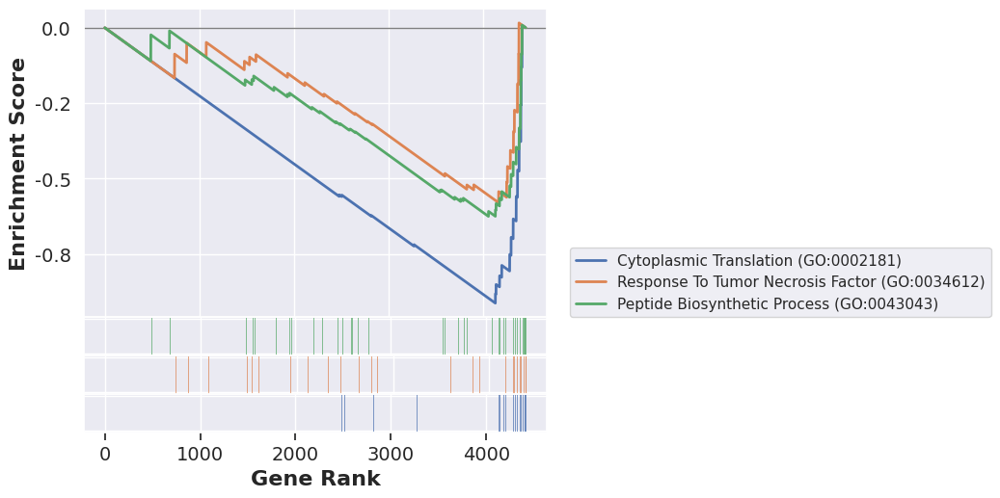

In [176]:
Mono16_cells_h.plots_h()

In [86]:
Mono16_cells_m = gsea(merged_adata_2, "Mono CD16", 'Mouse')
Mono16_cells_m.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
<ipython-input-69-19c01dfcf2a5>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.mouse_sign['Rank'] = -np.log10(self.mouse_sign.pvals_adj)*self.mouse_sign.logfoldchanges
2023-12-20 22:16:56,056 [WARNING] Duplicated values found in preranked stats: 5.99% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,fdr,es,nes
0,Cytoplasmic Translation (GO:0002181),0.000000,0.950362,2.444400
1,"Retrograde Vesicle-Mediated Transport, Golgi T...",0.000000,0.769564,2.049608
2,Regulation Of Necroptotic Process (GO:0060544),0.182022,0.882678,1.813716
3,Positive Regulation Of Proteolysis Involved In...,0.189361,0.769439,1.785634
4,Negative Regulation Of Signaling (GO:0023057),0.378723,0.678475,1.685947
...,...,...,...,...
1887,Potassium Ion Import Across Plasma Membrane (G...,1.000000,-0.649106,-1.000035
1888,Heterochromatin Formation (GO:0031507),1.000000,0.273038,0.545055
1889,Positive Regulation Of Developmental Process (...,1.000000,-0.608322,-0.969303
1890,Negative Regulation Of Protein Phosphorylation...,1.000000,-0.558694,-0.855028


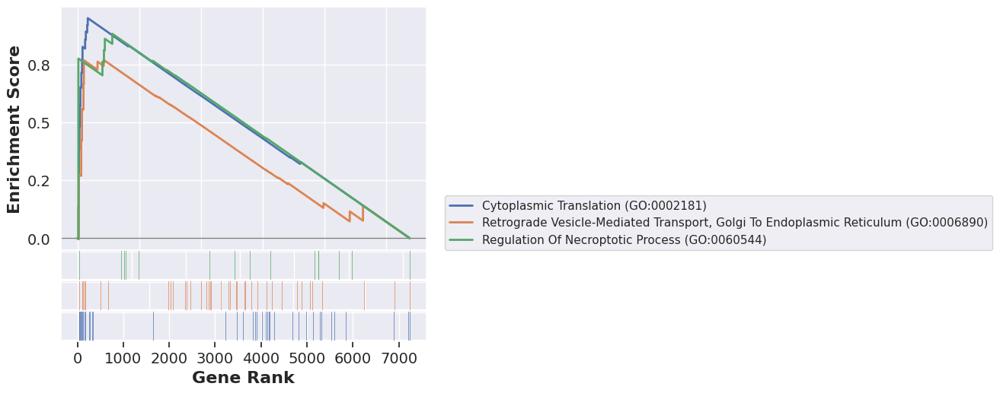

In [178]:
Mono16_cells_m.plots_m()

## Macrophages

In [87]:
Macro_cells_h = gsea(merged_adata_2, "Macrophages", 'Human')
Macro_cells_h.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
<ipython-input-69-19c01dfcf2a5>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.human_sign['Rank'] = -np.log10(self.human_sign.pvals_adj)*self.human_sign.logfoldchanges


,Term,fdr,es,nes
0,Telomere Organization (GO:0032200),0.139340,0.454397,1.777589
1,Regulation Of Cellular Localization (GO:0060341),0.181143,0.602854,1.671336
2,Negative Regulation Of Neuron Apoptotic Proces...,0.323227,-0.927344,-1.432295
3,Regulation Of Small Molecule Metabolic Process...,0.385894,-0.964730,-1.456353
4,Fatty Acid Transport (GO:0015908),0.410631,-0.932768,-1.438428
...,...,...,...,...
821,Protein Ubiquitination (GO:0016567),1.000000,-0.347990,-0.514322
822,Calcium Ion Transmembrane Transport (GO:0070588),1.000000,-0.458679,-0.697418
823,Protein Localization To Nucleus (GO:0034504),1.000000,-0.226066,-0.336793
824,Regulation Of Cell Division (GO:0051302),1.000000,-0.357498,-0.525297


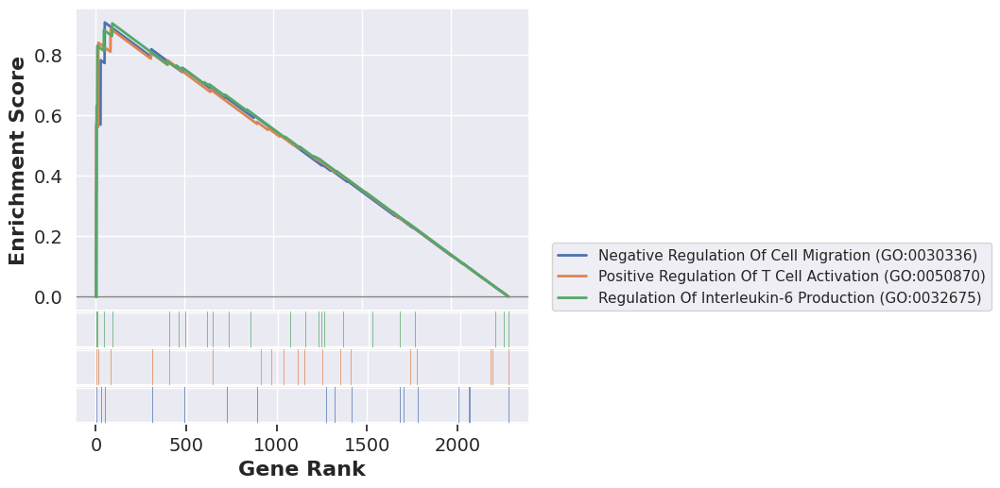

In [121]:
Macro_cells_h.plots_h()

In [88]:
Macro_cells_m = gsea(merged_adata_2, "Macrophages", 'Mouse')
Macro_cells_m.ranking()

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:582: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
<ipython-input-69-19c01dfcf2a5>:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.mouse_sign['Rank'] = -np.log10(self.mouse_sign.pvals_adj)*self.mouse_sign.logfoldchanges
2023-12-20 22:18:18,266 [WARNING] Duplicated values found in preranked stats: 8.36% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,fdr,es,nes
0,Regulation Of Viral Entry Into Host Cell (GO:0...,0.032779,-0.897483,-1.889079
1,Respiratory Chain Complex IV Assembly (GO:0008...,0.065557,-0.839465,-1.891515
2,Transcription Elongation By RNA Polymerase II ...,0.071801,-0.832837,-1.813608
3,Mitochondrial Cytochrome C Oxidase Assembly (G...,0.297350,-0.870013,-1.650423
4,Mitochondrial RNA Metabolic Process (GO:0000959),0.307719,-0.619642,-1.583344
...,...,...,...,...
1900,mRNA Splice Site Recognition (GO:0006376),1.000000,0.373014,0.501488
1901,Base-Excision Repair (GO:0006284),1.000000,0.275097,0.376978
1902,rRNA Metabolic Process (GO:0016072),1.000000,0.404176,0.567958
1903,Regulation Of Cell Death (GO:0010941),1.000000,0.329383,0.455314


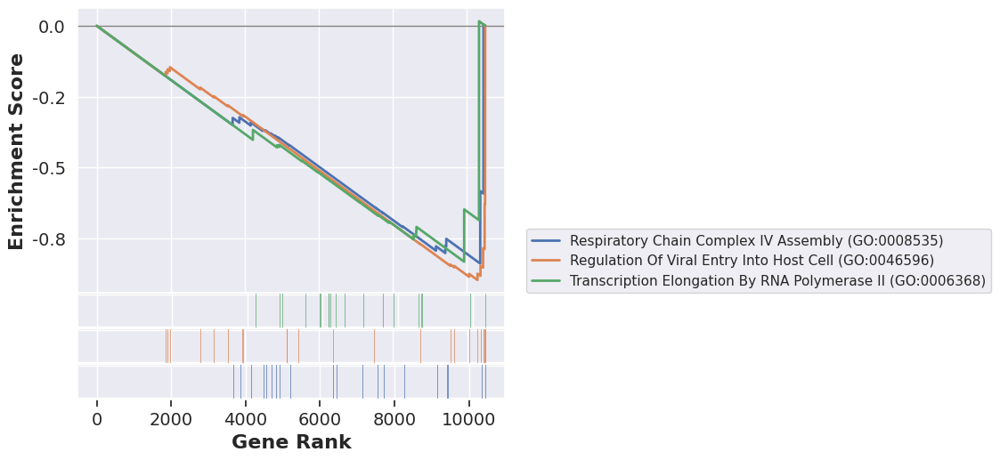

In [181]:
Macro_cells_m.plots_m()